##### imports

# TO-DO:
- debug/fine-tune XAI functions
    - modularize
- Apply XAI to AllClass2 model (standardized inputs)

In [2]:
import tensorflow as tf
import keras
from keras.saving import load_model
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.applications import MobileNetV2
from keras import layers,models
from tensorflow import data as tf_data
import os
import random
import zipfile
import shutil
import pandas as pd
from sklearn.metrics import (roc_curve, roc_auc_score, confusion_matrix,
                             ConfusionMatrixDisplay,classification_report)
import reload_data2
#from google.colab import drive
#drive.mount('/content/drive')

import random

! pip install lime
from lime import lime_image
from skimage.segmentation import mark_boundaries


os.environ["KERAS_BACKEND"] = "tensorflow"

# Display
from IPython.display import Image, display
import matplotlib as mpl
import matplotlib.cm as cm
import cv2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=37828cf642469b1c49a082a0b6bfc187d0e64ad9e62be3b7499c3866d1dbd72c
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


## Functions

In [ ]:
### Grad-CAM
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name, pred_index=None):
    # 1. Access the base MobileNetV2 layer
    base_model = model.get_layer("mobilenetv2_1.00_224")

    # 2. Build a model that stops at the base model's output
    # It returns [The Feature Map, The Base Predictions]
    grad_model = keras.models.Model(
        inputs=[base_model.inputs],
        outputs=[base_model.get_layer(last_conv_layer_name).output, base_model.output]
    )

    with tf.GradientTape() as tape:
        # Get the feature map and the base model's output
        last_conv_layer_output, base_preds = grad_model(img_array)

        # 3. Manually pass base_preds through the rest of the TOP of your model
        # We find where the base model sits in the main model's layers
        found_base = False
        x = base_preds
        for layer in model.layers:
            if found_base:
                x = layer(x)
            if layer == base_model:
                found_base = True

        final_preds = x # This is now your (1, 475) prediction tensor

###################################################################
        #if pred_index is None:
        #    pred_index = tf.argmax(final_preds[0])
        #class_channel = final_preds[:, pred_index]

        # Ensure final_preds is (1, 475)
        # If argmax is returning a list, it thinks the batch is 475!
        if pred_index is None:
            # We use axis=-1 to get the max class for the prediction
            pred_index = tf.argmax(final_preds[0], axis=-1)

        # We need pred_index to be a simple integer index
        class_channel = final_preds[:, pred_index]
###################################################################

    # 4. Calculate gradients
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # 5. Multiply the feature map by the importance of each channel
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # 6. Normalize
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


def plot_gradcam_from_dataset(dataset, model, last_conv_layer_name):
    # 1. Grab one batch (e.g., 32 images) from the dataset
    # We take the first batch available
    for images, labels in dataset.take(1):
        # Move to numpy for easier handling
        images = images.numpy()
        labels = labels.numpy()

        # Get the class names directly from the dataset object
        class_names = dataset.class_names

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()

    # Pick 4 random indices from this batch
    indices = np.random.choice(range(len(images)), 4, replace=False)

    for i, idx in enumerate(indices):
        img_array = images[idx:idx+1] # Keep the batch dimension (1, 384, 384, 3)
        true_idx = labels[idx]
        true_name = class_names[true_idx]

        # 2. Get Predictions
        preds = model.predict(img_array, verbose=0)
        # Apply softmax if your model outputs raw logits
        preds = tf.nn.softmax(preds)

        top_3_values, top_3_indices = tf.math.top_k(preds[0], k=3)
        top_3_names = [class_names[j] for j in top_3_indices.numpy()]
        top_3_confs = [f"{v:.2%}" for v in top_3_values.numpy()]

        # 3. Generate Heatmap
        # We pass the image array directly from the dataset
        heatmap = make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name)

        # 4. Superimpose
        # Note: 'img_array' from the dataset might be normalized (-1 to 1 or 0 to 1)
        # We need to de-process it just for display purposes
        low = img_array[0].min()
        high = img_array[0].max()
        display_img = (img_array[0] - low) / (high - low) # Scale to [0, 1]
        display_img = np.uint8(255 * display_img)

        # Colorize and resize heatmap
        heatmap_img = np.uint8(255 * heatmap)
        jet = cm.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[heatmap_img]
        jet_heatmap = keras.utils.array_to_img(jet_heatmap).resize((display_img.shape[1], display_img.shape[0]))
        jet_heatmap = keras.utils.img_to_array(jet_heatmap)

        superimposed_img = jet_heatmap * 0.4 + display_img
        superimposed_img = keras.utils.array_to_img(superimposed_img)

        # 5. Plot
        axes[i].imshow(superimposed_img)
        axes[i].axis('off')


        # ... (Inside the loop after getting top_3_names and top_3_confs)

        # 1. Determine the overall status
        is_in_top_3 = true_name in top_3_names

        # 2. Build the title text and colors
        # Start with the True Label
        title_lines = [f"True: {true_name}"]
        line_colors = ['green' if is_in_top_3 else 'red']

        # Check each prediction in the top 3
        for j in range(3):
            pred_name = top_3_names[j]
            conf = top_3_confs[j]
            line_text = f"{j+1}. {pred_name} ({conf})"

            if pred_name == true_name:
                line_text += " [CORRECT]"
                line_colors.append('green')
            elif is_in_top_3:
                # If the true label IS in the top 3, keep others neutral (black)
                line_colors.append('black')
            else:
                # If true label is NOT in top 3, everything is red
                line_colors.append('red')

            title_lines.append(line_text)

        # 3. Create the multi-colored title
        # Matplotlib titles don't support multi-colors per line easily,
        # so we use 'text' or just set the overall axis color based on your rule.

        full_title = "\n".join(title_lines)
        overall_color = 'green' if is_in_top_3 else 'red'

        axes[i].imshow(superimposed_img)
        axes[i].axis('off')
        axes[i].set_title(full_title, color=overall_color, fontsize=10, loc='left', linespacing=1.2)

        #title = f"True: {true_name}\n"
        #title += f"1. {top_3_names[0]} ({top_3_confs[0]})\n"
        #title += f"2. {top_3_names[1]} ({top_3_confs[1]})\n"
        #title += f"3. {top_3_names[2]} ({top_3_confs[2]})"

        #color = 'green' if true_name in top_3_names else 'red'
        #axes[i].set_title(title, color=color, fontsize=10, loc='left')

    plt.tight_layout()
    plt.show()


### LIME
def scale_for_display(img):
    """Helper to ensure image is in [0, 1] range for imshow"""
    img = np.array(img, dtype=float)
    low, high = img.min(), img.max()
    if high > low:
        return (img - low) / (high - low)
    return img

def explain_lime_from_dataset(dataset, model, num_samples=1000):
    # 1. Grab a batch and pick a random image
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    idx = np.random.randint(0, len(images_np))
    raw_img = images_np[idx]

    # Handle range for LIME (needs [0, 1] or [0, 255])
    if raw_img.min() < 0:
        raw_img = (raw_img + 1.0) / 2.0

    # 2. Define the prediction function
    def predict_fn(instances):
        # Scale back to [-1, 1] for MobileNetV2
        instances = (instances * 2.0) - 1.0
        preds = model.predict(instances, verbose=0)
        return tf.nn.softmax(preds).numpy()

    # 3. Run the explainer
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(
        raw_img.astype('double'),
        predict_fn,
        top_labels=5,
        hide_color=0,
        num_samples=num_samples
    )

    # 4. INITIALIZE THE PLOT (This fixes the 'ax' error)
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Column 1: Original Image
    ax[0].imshow(scale_for_display(raw_img))
    ax[0].set_title(f"Original\nTrue: {class_names[labels_np[idx]]}")
    ax[0].axis('off')

    # Column 2: Pros & Cons
    # Green = Positive impact on prediction, Red = Negative
    temp_pn, mask_pn = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False
    )
    ax[1].imshow(mark_boundaries(scale_for_display(temp_pn), mask_pn))
    ax[1].set_title(f"Pros (Green) / Cons (Red)\nPred: {class_names[explanation.top_labels[0]]}")
    ax[1].axis('off')

    # Column 3: The Evidence (Just the bits that helped)
    temp_p, mask_p = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
    )
    ax[2].imshow(mark_boundaries(scale_for_display(temp_p), mask_p))
    ax[2].set_title(f"Supportive Features Only")
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()


def plot_ultimate_explanation(dataset, model, last_conv_layer_name, num_samples=500):
    # 1. Grab a sample from the dataset
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    idx = np.random.randint(0, len(images_np))
    img_tensor = images_np[idx:idx+1] # Shape (1, 384, 384, 3)
    true_label = class_names[labels_np[idx]]

    # 2. Get Model Prediction
    preds = model.predict(img_tensor, verbose=0)
    preds_norm = tf.nn.softmax(preds)
    pred_idx = np.argmax(preds_norm[0])
    pred_label = class_names[pred_idx]
    confidence = preds_norm[0][pred_idx]

    # --- START CALCULATIONS ---

    # 3. Generate Grad-CAM
    heatmap = make_gradcam_heatmap_alt(img_tensor, model, last_conv_layer_name)

    # 4. Generate LIME
    raw_img_for_lime = (img_tensor[0] + 1.0) / 2.0 if img_tensor[0].min() < 0 else img_tensor[0]
    explainer = lime_image.LimeImageExplainer()

    def predict_fn(instances):
        # Assuming MobileNetV2 [-1, 1] preprocessing
        instances = (instances * 2.0) - 1.0
        p = model.predict(instances, verbose=0)
        return tf.nn.softmax(p).numpy()

    explanation = explainer.explain_instance(
        raw_img_for_lime.astype('double'),
        predict_fn,
        top_labels=5,
        num_samples=num_samples
    )

    # --- START PLOTTING ---

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    # 1. ORIGINAL IMAGE
    axes[0, 0].imshow(scale_for_display(raw_img_for_lime))
    axes[0, 0].set_title(f"Original\nTrue: {true_label}", fontsize=12)
    axes[0, 0].axis('off')

    # 2. LIME: PROS & CONS
    temp_pn, mask_pn = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False
    )
    axes[0, 1].imshow(mark_boundaries(scale_for_display(temp_pn), mask_pn))
    axes[0, 1].set_title(f"LIME: Pros (Green) / Cons (Red)\nPred: {pred_label} ({confidence:.1%})", fontsize=12)
    axes[0, 1].axis('off')

    # 3. LIME: SUPPORTIVE ONLY
    temp_p, mask_p = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
    )
    axes[1, 0].imshow(mark_boundaries(scale_for_display(temp_p), mask_p))
    axes[1, 0].set_title("LIME: Top Supportive Features", fontsize=12)
    axes[1, 0].axis('off')

    # 4. GRAD-CAM
    # Colorize Grad-CAM
# --- 4. GRAD-CAM (FIXED) ---
    # 1. Resize heatmap to match image size (384, 384)
    # This uses bilinear interpolation to make the 12x12 grid a smooth 384x384 overlay
    heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (img_tensor.shape[1], img_tensor.shape[2]))
    heatmap_resized = tf.squeeze(heatmap_resized).numpy()

    # 2. Colorize the upscaled heatmap
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[np.uint8(255 * heatmap_resized)]

    # 3. Use the original image for overlay
    display_img = scale_for_display(raw_img_for_lime)

    # Now both are (384, 384, 3)!
    superimposed_img = jet_heatmap * 0.4 + display_img

    axes[1, 1].imshow(scale_for_display(superimposed_img))
    axes[1, 1].set_title(f"Grad-CAM: {last_conv_layer_name} Layer", fontsize=12)
    axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def make_gradcam_heatmap(img_array, model, pred_index=None):

    # Grab the MobileNet base
    base_model = model.get_layer("mobilenetv2_1.00_224")

    # Last conv layer inside MobileNet
    last_conv_layer = base_model.get_layer("out_relu")

    # Build a model that returns:
    # 1) conv features
    # 2) final predictions
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[last_conv_layer.output, model.output]
    )

    # Ensure tensor format
    img_tensor = tf.convert_to_tensor(img_array)

    with tf.GradientTape() as tape:
        conv_outputs, preds = grad_model(img_tensor, training=False)

        if pred_index is None:
            pred_index = tf.argmax(preds[0])

        class_channel = preds[:, pred_index]

    # Compute gradients
    grads = tape.gradient(class_channel, conv_outputs)

    # Channel importance
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]

    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize safely
    heatmap = tf.maximum(heatmap, 0)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy()


def plot_gradcam_from_dataset(dataset, model, last_conv_layer_name):
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    indices = np.random.choice(range(len(images_np)), 4, replace=False)

    for i, idx in enumerate(indices):
        img_array = images_np[idx:idx+1]
        true_name = class_names[labels_np[idx]]

        # 2. Get Predictions
        preds = model.predict(img_array, verbose=0)
        preds = tf.nn.softmax(preds)
        top_3_values, top_3_indices = tf.math.top_k(preds[0], k=3)
        top_3_names = [class_names[j] for j in top_3_indices.numpy()]
        top_3_confs = [f"{v:.2%}" for v in top_3_values.numpy()]

        # 3. Generate Heatmap
        heatmap = make_gradcam_heatmap(img_array, model)

        # 4. Superimpose with Resize Fix
        # First, resize heatmap (12x12) to match image size (e.g., 384x384)
        heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (img_array.shape[1], img_array.shape[2]))
        heatmap_resized = tf.squeeze(heatmap_resized).numpy()

        # Scale original image for display
        low, high = img_array[0].min(), img_array[0].max()
        display_img = (img_array[0] - low) / (high - low)
        display_img = np.uint8(255 * display_img)

        # Colorize
        jet = cm.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[np.uint8(255 * heatmap_resized)]
        jet_heatmap = keras.utils.array_to_img(jet_heatmap).resize((display_img.shape[1], display_img.shape[0]))
        jet_heatmap = keras.utils.img_to_array(jet_heatmap)

        superimposed_img = jet_heatmap * 0.4 + display_img

        # 5. Plot and Titles
        axes[i].imshow(superimposed_img / 255.0)
        axes[i].axis('off')

        is_in_top_3 = true_name in top_3_names
        title_lines = [f"True: {true_name}"]
        for j in range(3):
            line_text = f"{j+1}. {top_3_names[j]} ({top_3_confs[j]})"
            if top_3_names[j] == true_name: line_text += " [CORRECT]"
            title_lines.append(line_text)

        full_title = "\n".join(title_lines)
        axes[i].set_title(full_title, color='green' if is_in_top_3 else 'red', loc='left')

    plt.tight_layout()
    plt.show()

## Data Loading

In [ ]:
preprocess_input = keras.applications.mobilenet_v2.preprocess_input
base_model="mobilenetv2_1.00_224"

In [ ]:
model = load_model("/content/MobileNetV2_allclass2.keras")
model.summary()

Model: "mobilenet_allclass2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

In [ ]:
! unzip -q /content/AllClass2_test.zip

In [ ]:
data_dir = "/content/content/New_Data"
IMAGE_SIZE = (384,384)
BATCH_SIZE = 64

In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    label_mode='int',
    color_mode='rgb',
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    )

Found 2850 files belonging to 475 classes.


In [ ]:
model_class_names = test_ds.class_names
print(model_class_names[:10])

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012']


In [ ]:
print(model.get_layer("mobilenetv2_1.00_224").summary())

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 192, 192,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 192, 192,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 192, 192,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 192, 192,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 192, 192,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 192, 192,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 193, 193,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 96, 96,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 96, 96,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

None


In [ ]:
model.summary()

Model: "mobilenet_allclass2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

KeyError: "Exception encountered when calling Functional.call().\n\n\x1b[1m137791760391280\x1b[0m\n\nArguments received by Functional.call():\n  • inputs=tf.Tensor(shape=(1, 384, 384, 3), dtype=float32)\n  • training=False\n  • mask=None\n  • kwargs=<class 'inspect._empty'>"

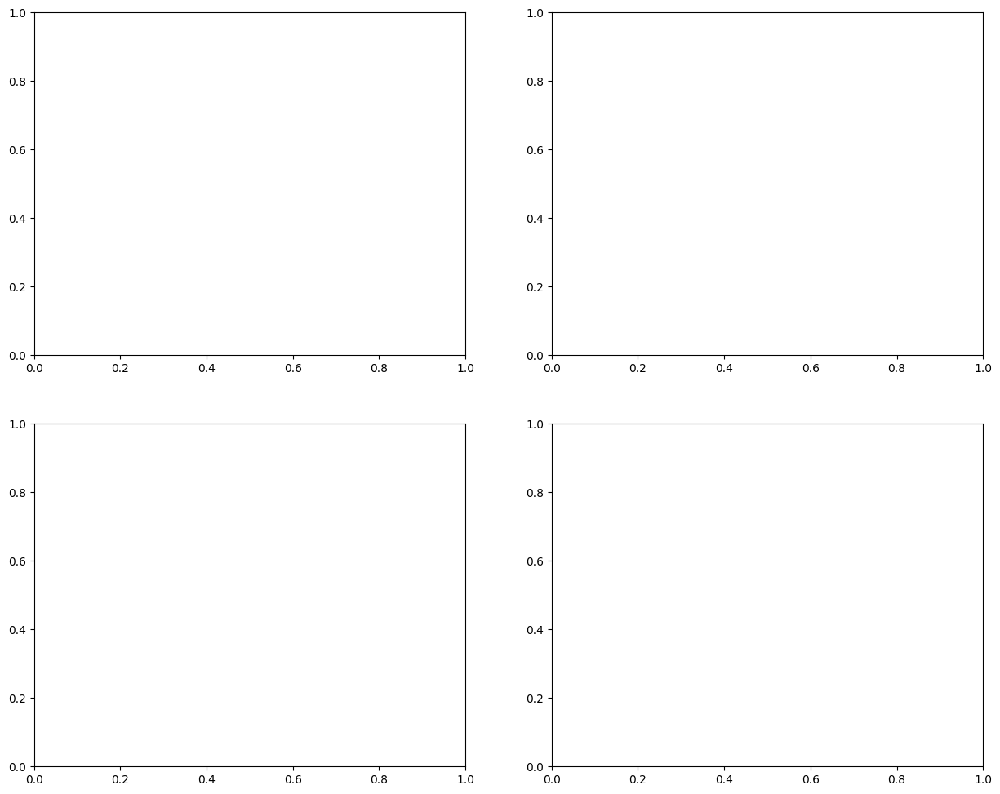

In [ ]:
%%time
plot_gradcam_from_dataset(test_ds,model,"out_relu")

## New Functions

In [ ]:
def make_gradcam_heatmap(img_batch, model):

    # Get the base model
    base_model = model.get_layer("mobilenetv2_1.00_224")

    # Last conv layer inside MobileNet
    last_conv_layer = base_model.get_layer("out_relu")

    # Build a model that outputs conv features
    conv_model = tf.keras.Model(
        base_model.input,
        last_conv_layer.output
    )

    # Build the classifier head manually
    classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input

    start = False
    for layer in model.layers:
        if layer.name == "dropout":
            start = True
        if start:
            x = layer(x)

    classifier_model = tf.keras.Model(classifier_input, x)

    img_tensor = tf.convert_to_tensor(img_batch)

    with tf.GradientTape() as tape:

        conv_outputs = conv_model(img_tensor)

        tape.watch(conv_outputs)

        preds = classifier_model(conv_outputs)

        pred_index = tf.argmax(preds[0])

        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    heatmap = tf.maximum(heatmap, 0)

    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy()


def overlay_heatmap(image, heatmap, alpha=0.35):

    heatmap = tf.image.resize(
        heatmap[..., tf.newaxis],
        (image.shape[0], image.shape[1])
    ).numpy()

    heatmap = np.squeeze(heatmap)

    heatmap = np.uint8(255 * heatmap)

    cmap = plt.get_cmap("jet")

    colored = cmap(heatmap)[:, :, :3]

    colored = np.uint8(colored * 255)

    # Proper alpha blending
    overlay = (1 - alpha) * image + alpha * colored

    overlay = np.clip(overlay, 0, 255).astype("uint8")

    return overlay


def plot_gradcam_from_dataset(dataset, model, n_images=4):
    class_names = dataset.class_names

    # Grab a batch of images and labels
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = labels.numpy()

    # Randomly pick indices
    idxs = np.random.choice(len(images), n_images, replace=False)

    fig, axes = plt.subplots(1, n_images, figsize=(5*n_images,5))
    if n_images == 1:
        axes = [axes]

    for ax, idx in zip(axes, idxs):
        img = images[idx]
        img_batch = images[idx:idx+1]

        # Get predictions
        preds = model(img_batch, training=False)
        probs = tf.nn.softmax(preds)[0].numpy()
        pred_idx = np.argmax(probs)
        true_idx = labels[idx]

        # Generate Grad-CAM heatmap
        heatmap = make_gradcam_heatmap(img_batch, model)
        overlay = overlay_heatmap(img, heatmap)

        ax.imshow(overlay)
        ax.axis("off")

        # Choose color: green if correct, red if incorrect
        color = "green" if pred_idx == true_idx else "red"

        # Set title with color
        ax.set_title(
            f"True: {class_names[true_idx]}\n"
            f"Pred: {class_names[pred_idx]}\n"
            f"{probs[pred_idx]*100:.2f}%",
            color=color
        )

    plt.tight_layout()
    plt.show()

In [ ]:
### TEST FUNCTIONS

def make_gradcam_heatmap(img_batch, model, top_k=3):
    """
    Returns the Grad-CAM heatmap for the top-1 prediction,
    and the top_k class indices and probabilities.
    """

    # Get the base model
    base_model = model.get_layer("mobilenetv2_1.00_224")

    # Last conv layer inside MobileNet
    last_conv_layer = base_model.get_layer("out_relu")

    # Build a model that outputs conv features
    conv_model = tf.keras.Model(
        base_model.input,
        last_conv_layer.output
    )

    # Build the classifier head manually
    classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input

    start = False
    for layer in model.layers:
        if layer.name == "dropout":
            start = True
        if start:
            x = layer(x)

    classifier_model = tf.keras.Model(classifier_input, x)

    img_tensor = tf.convert_to_tensor(img_batch)

    with tf.GradientTape() as tape:
        conv_outputs = conv_model(img_tensor)
        tape.watch(conv_outputs)

        preds = classifier_model(conv_outputs)
        probs = tf.nn.softmax(preds[0])

        # Get top_k predictions
        top_probs, top_indices = tf.math.top_k(probs, k=top_k)

        # Grad-CAM for top-1 prediction
        pred_index = top_indices[0]
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy(), top_indices.numpy(), top_probs.numpy()


def make_gradcam_heatmap_single(img, model, top_k=3):
    """
    Grad-CAM for a single image.
    Returns:
        heatmap, top_indices, top_probs
    """
    img_batch = tf.expand_dims(img, axis=0)  # ensure batch size 1

    base_model = model.get_layer("mobilenetv2_1.00_224")
    last_conv_layer = base_model.get_layer("out_relu")
    conv_model = tf.keras.Model(base_model.input, last_conv_layer.output)

    # Classifier head
    classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    start = False
    for layer in model.layers:
        if layer.name == "dropout":
            start = True
        if start:
            x = layer(x)
    classifier_model = tf.keras.Model(classifier_input, x)

    with tf.GradientTape() as tape:
        conv_outputs = conv_model(img_batch)
        tape.watch(conv_outputs)
        preds = classifier_model(conv_outputs)
        probs = tf.nn.softmax(preds[0])

        top_probs, top_indices = tf.math.top_k(probs, k=top_k)

        # Grad-CAM for top-1
        pred_index = top_indices[0]
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy(), top_indices.numpy(), top_probs.numpy()


def plot_gradcam_from_dataset_top3(dataset, model, n_images=4, top_k=3):
    class_names = dataset.class_names

    # Grab a batch of images and labels
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = labels.numpy()

    # Randomly pick indices
    idxs = np.random.choice(len(images), n_images, replace=False)

    fig, axes = plt.subplots(1, n_images, figsize=(5*n_images,5))
    if n_images == 1:
        axes = [axes]

    for ax, idx in zip(axes, idxs):
        img = images[idx]
        img_batch = images[idx:idx+1]

        # Get Grad-CAM heatmap and top-k predictions
        heatmap, top_indices, top_probs = make_gradcam_heatmap(img_batch, model, top_k=top_k)
        #heatmap, top_indices, top_probs = make_gradcam_heatmap_single(img, model, top_k=top_k)

        overlay = overlay_heatmap(img, heatmap)

        true_idx = labels[idx]

        ax.imshow(overlay)
        ax.axis("off")

        # Build title with top-k predictions
        title_lines = [f"True: {class_names[true_idx]}"]
        for i, (pred_idx, prob) in enumerate(zip(top_indices, top_probs)):
            color = "green" if pred_idx == true_idx else "red"
            title_lines.append(f"Top {i+1}: {class_names[pred_idx]} ({prob*100:.2f}%)")

        # Combine lines and display with colored top predictions
        ax.set_title("\n".join(title_lines), fontsize=10)

        # Alternative: color only top-1 in title
        #ax.set_title(f"True: {class_names[true_idx]}\nTop1: {class_names[top_indices[0]]} ({top_probs[0]*100:.2f}%)",
        #             color="green" if top_indices[0] == true_idx else "red")

    plt.tight_layout()
    plt.show()


def plot_gradcam_from_dataset_top3_single(dataset, model, n_images=4, top_k=3):
    """DOESN'T WORK"""
    class_names = dataset.class_names

    # Grab a batch of images and labels
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = labels.numpy()

    # Randomly pick indices
    idxs = np.random.choice(len(images), n_images, replace=False)

    fig, axes = plt.subplots(1, n_images, figsize=(5*n_images,5))
    if n_images == 1:
        axes = [axes]

    for ax, idx in zip(axes, idxs):
        img = images[idx]         # single image from dataset
        true_idx = labels[idx]

        # Pass the single image to the Grad-CAM function
        heatmap, top_indices, top_probs = make_gradcam_heatmap_single(img, model, top_k=3)

        # Overlay heatmap
        overlay = overlay_heatmap(img, heatmap)

        ax.imshow(overlay)
        ax.axis("off")

        # Display text on top (True + top-3 predictions)
        # ... [your ax.text code here]

        # Build title with top-k predictions
        title_lines = [f"True: {class_names[true_idx]}"]
        for i, (pred_idx, prob) in enumerate(zip(top_indices, top_probs)):
            color = "green" if pred_idx == true_idx else "red"
            title_lines.append(f"Top {i+1}: {class_names[pred_idx]} ({prob*100:.2f}%)")

        # Combine lines and display with colored top predictions
        ax.set_title("\n".join(title_lines), fontsize=10)

        # Alternative: color only top-1 in title
        #ax.set_title(f"True: {class_names[true_idx]}\nTop1: {class_names[top_indices[0]]} ({top_probs[0]*100:.2f}%)",
        #             color="green" if top_indices[0] == true_idx else "red")

    plt.tight_layout()
    plt.show()


def plot_gradcam_from_dataset_top3_colored(dataset, model, n_images=4, top_k=3):
    """DOESN'T WORK"""
    class_names = dataset.class_names

    # Grab a batch of images and labels
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = labels.numpy()

    # Randomly pick indices
    idxs = np.random.choice(len(images), n_images, replace=False)

    fig, axes = plt.subplots(1, n_images, figsize=(5*n_images,5))
    if n_images == 1:
        axes = [axes]

    for ax, idx in zip(axes, idxs):
        img = images[idx]
        img_batch = images[idx:idx+1]

        # Get Grad-CAM heatmap and top-k predictions
        heatmap, top_indices, top_probs = make_gradcam_heatmap(img_batch, model, top_k=top_k)
        overlay = overlay_heatmap(img, heatmap)

        true_idx = labels[idx]

        ax.imshow(overlay)
        ax.axis("off")

        # Start y position near the top
        y_start = 0.95
        y_step = 0.08

        # Display True label on top
        ax.text(0.5, y_start, f"True: {class_names[true_idx]}", color="black",
                fontsize=10, ha='center', va='top', transform=ax.transAxes)

        # Display top-k predictions with coloring
        for i, (pred_idx, prob) in enumerate(zip(top_indices, top_probs)):
            # Color green if prediction matches true label, else red
            color = "green" if pred_idx == true_idx else "red"
            # Highlight the correct one by making it bold
            weight = "bold" if pred_idx == true_idx else "normal"
            ax.text(0.5, y_start - (i+1)*y_step,
                    f"Top {i+1}: {class_names[pred_idx]} ({prob*100:.2f}%)",
                    color=color, fontsize=9, ha="center",va='top', fontweight=weight,
                    transform=ax.transAxes)

    plt.tight_layout()
    plt.show()

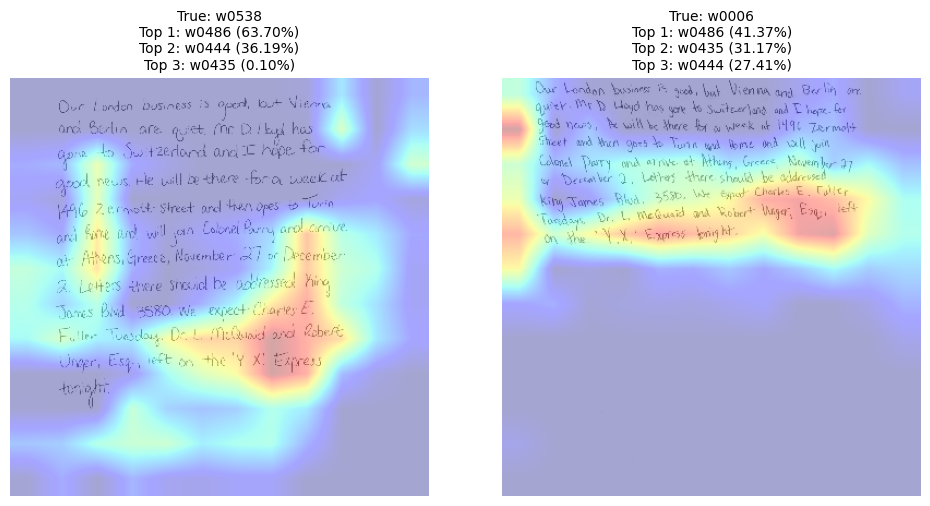

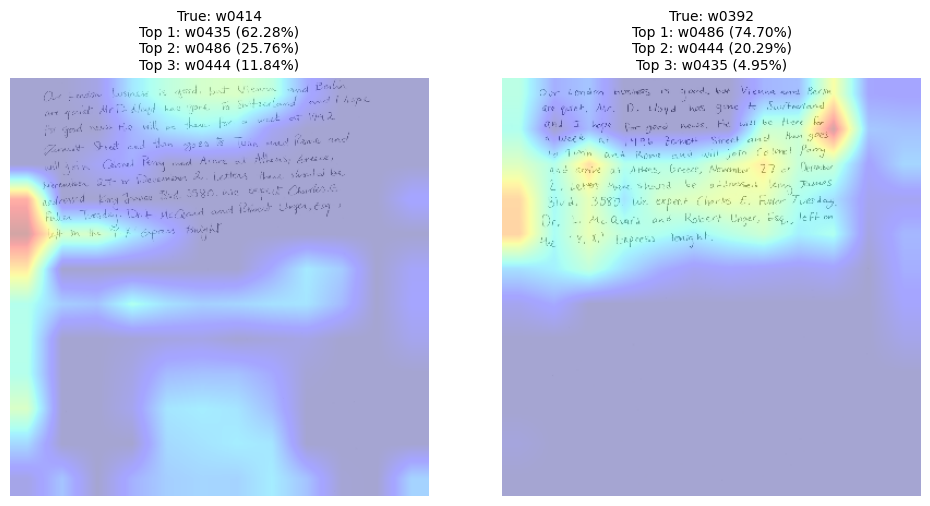

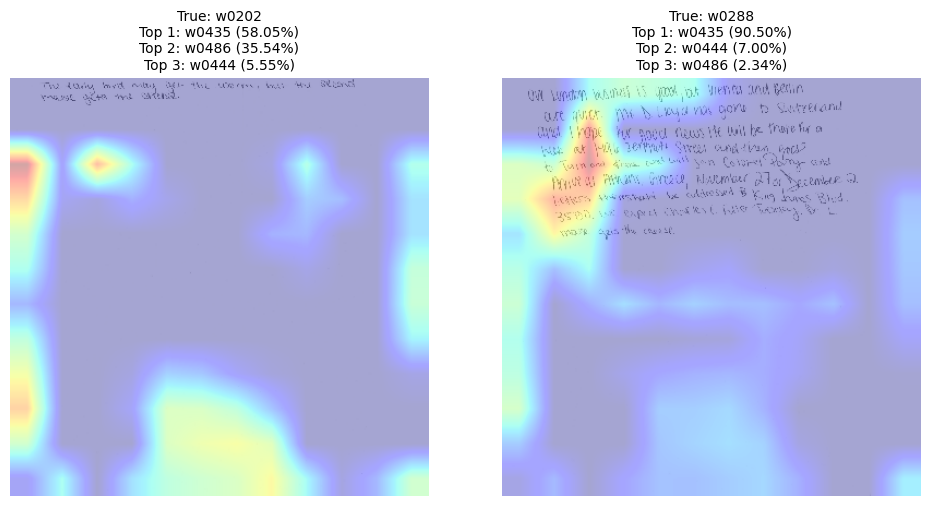

CPU times: user 30.4 s, sys: 745 ms, total: 31.1 s
Wall time: 20.5 s


In [ ]:
%%time
plot_gradcam_from_dataset_top3_single(test_ds, model, n_images=2)
plot_gradcam_from_dataset_top3_single(test_ds, model, n_images=2)
plot_gradcam_from_dataset_top3_single(test_ds, model, n_images=2)

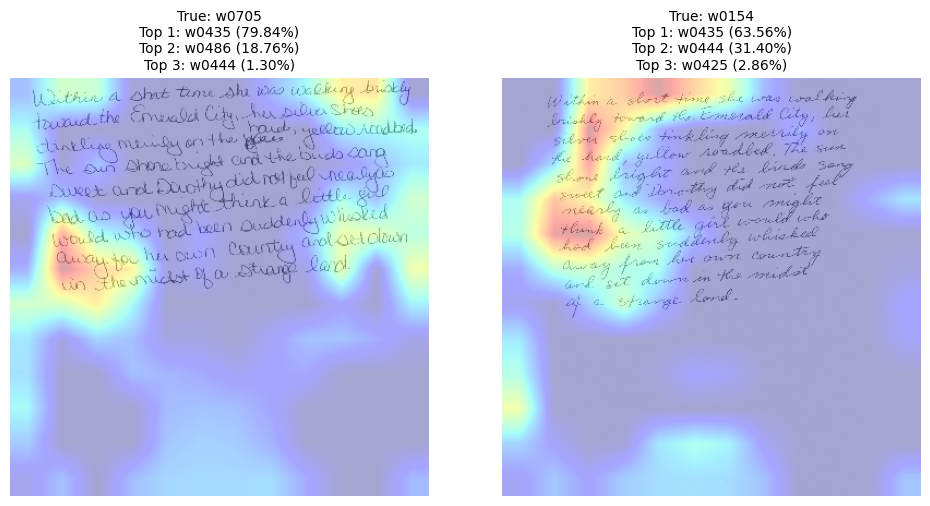

In [ ]:
plot_gradcam_from_dataset_top3(test_ds, model, n_images=2)

    ^^ Issues with prediction index/label handling

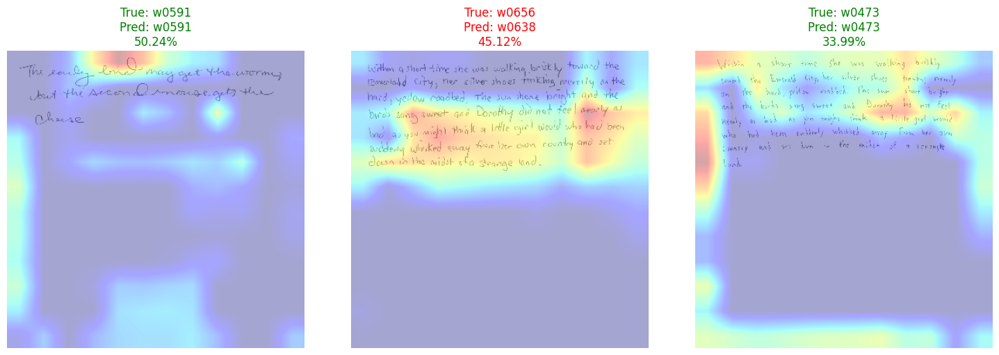

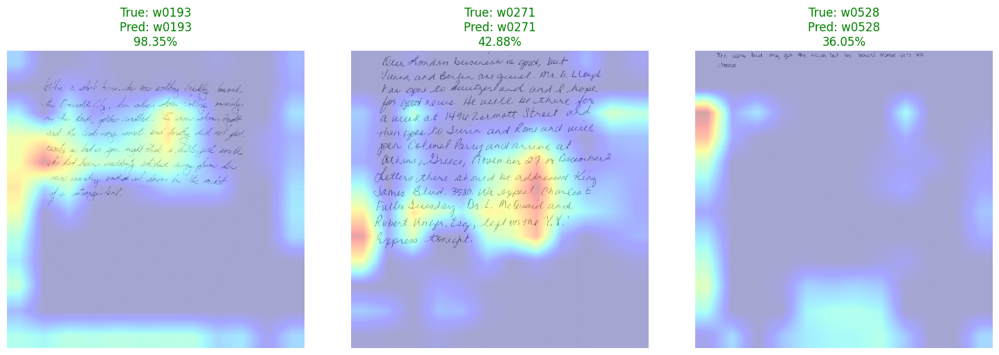

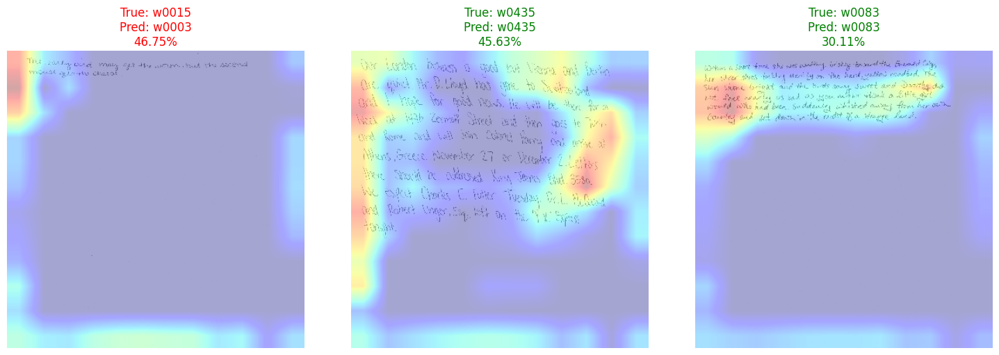

In [ ]:
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)

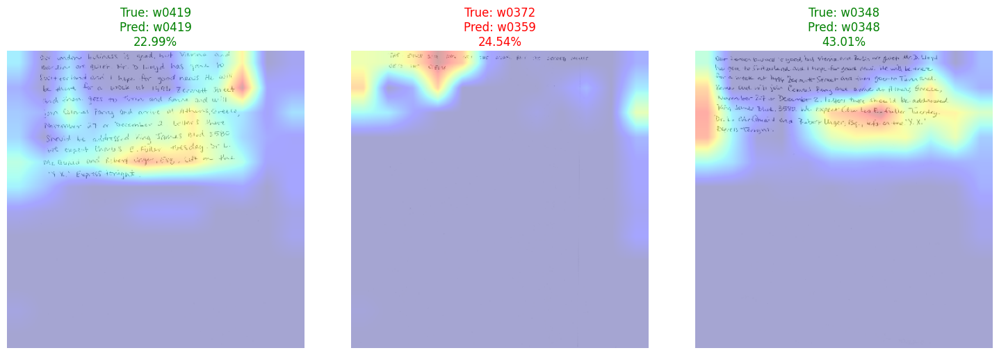

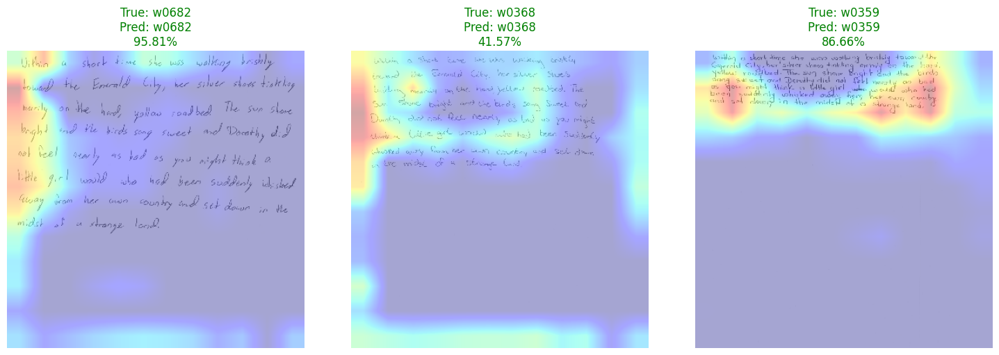

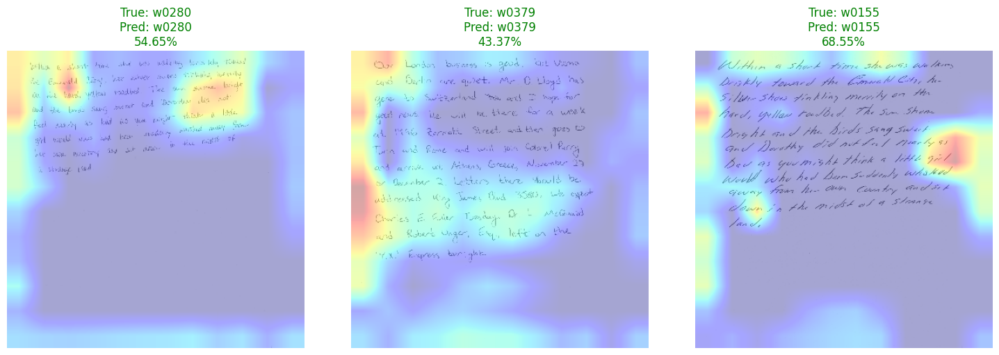

In [ ]:
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


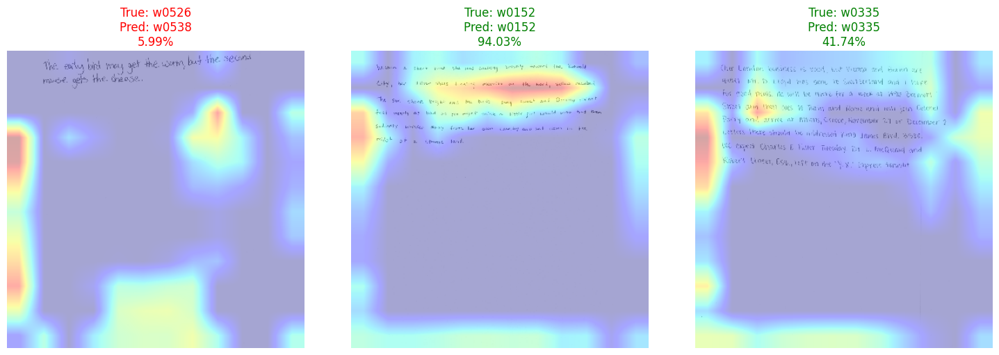

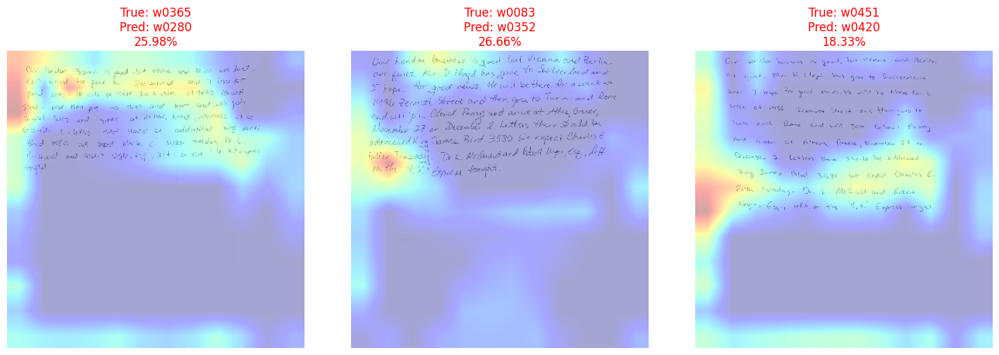

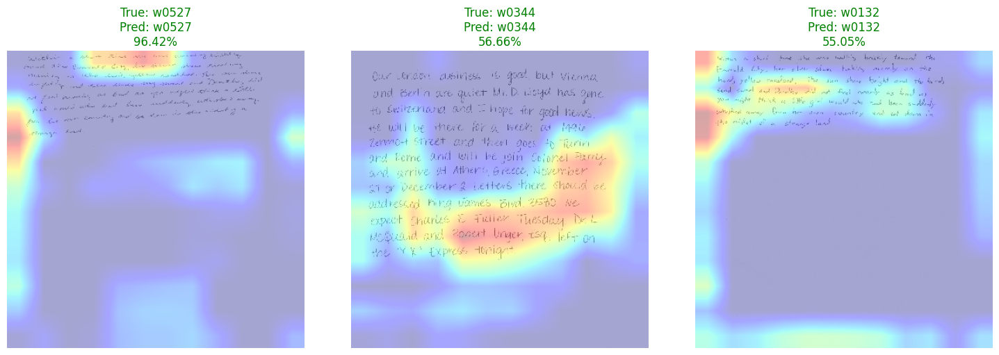

In [ ]:
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)

### New (unsuccessful)

In [ ]:
import tensorflow as tf
import numpy as np

def make_gradcam_heatmap(img_batch, model):

    base_model = model.get_layer("mobilenetv2_1.00_224")
    last_conv = base_model.get_layer("Conv_1")

    with tf.GradientTape() as tape:

        # forward pass
        preds = model(img_batch, training=False)

        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

        # watch the conv layer
        conv_output = last_conv.output

    grads = tape.gradient(class_channel, conv_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))

    conv_output = conv_output[0]

    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0)
    heatmap /= tf.reduce_max(heatmap) + 1e-8

    return heatmap.numpy()

import cv2

def overlay_heatmap(image, heatmap, alpha=0.4):

    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(image.astype("uint8"), 1-alpha, heatmap, alpha, 0)

    return overlay


import matplotlib.pyplot as plt

def plot_gradcam_from_dataset(dataset, model, class_names, n_images=4):

    images, labels = next(iter(dataset))

    correct_top3 = 0

    plt.figure(figsize=(10,10))

    for i in range(n_images):

        img = (images[i].numpy()*255).astype("uint8")
        img_batch = tf.expand_dims(images[i], axis=0)

        preds = model.predict(img_batch, verbose=0)[0]

        top3 = preds.argsort()[-3:][::-1]
        true = labels[i].numpy()

        if true in top3:
            color = "green"
            correct_top3 += 1
        else:
            color = "red"

        heatmap = make_gradcam_heatmap(img_batch, model)
        overlay = overlay_heatmap(img, heatmap)

        plt.subplot(2,2,i+1)
        plt.imshow(overlay)
        plt.axis("off")

        title = f"True: {class_names[true]}\n"
        for rank, idx in enumerate(top3):
            title += f"{rank+1}. {class_names[idx]} ({preds[idx]*100:.2f}%)\n"

        plt.title(title, color=color, fontsize=10)

    plt.tight_layout()

    print(f"Top-3 correct: {correct_top3}/{n_images}")

In [ ]:
%%time
plot_gradcam_from_dataset(
    test_ds,
    model,
    model_class_names,
    n_images=4
)

AttributeError: 'KerasTensor' object has no attribute '_id'

<Figure size 1000x1000 with 0 Axes>

In [ ]:
for layer in model.get_layer("mobilenetv2_1.00_224").layers[-10:]:
        print(layer.name, layer.output_shape)

AttributeError: 'BatchNormalization' object has no attribute 'output_shape'

# LIME (Semi-successful)

In [ ]:
def plot_ultimate_explanation(dataset, model, last_conv_layer_name, num_samples=500):
    # 1. Grab a sample from the dataset
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    idx = np.random.randint(0, len(images_np))
    img_tensor = images_np[idx:idx+1] # Shape (1, 384, 384, 3)
    true_label = class_names[labels_np[idx]]

    # 2. Get Model Prediction
    preds = model.predict(img_tensor, verbose=0)
    preds_norm = tf.nn.softmax(preds)
    pred_idx = np.argmax(preds_norm[0])
    pred_label = class_names[pred_idx]
    confidence = preds_norm[0][pred_idx]

    # --- START CALCULATIONS ---

    # 3. Generate Grad-CAM
    heatmap = make_gradcam_heatmap_alt(img_tensor, model, last_conv_layer_name)

    # 4. Generate LIME
    raw_img_for_lime = (img_tensor[0] + 1.0) / 2.0 if img_tensor[0].min() < 0 else img_tensor[0]
    explainer = lime_image.LimeImageExplainer()

    def predict_fn(instances):
        # Assuming MobileNetV2 [-1, 1] preprocessing
        instances = (instances * 2.0) - 1.0
        p = model.predict(instances, verbose=0)
        return tf.nn.softmax(p).numpy()

    explanation = explainer.explain_instance(
        raw_img_for_lime.astype('double'),
        predict_fn,
        top_labels=5,
        num_samples=num_samples
    )

    # --- START PLOTTING ---

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    # 1. ORIGINAL IMAGE
    axes[0, 0].imshow(scale_for_display(raw_img_for_lime))
    axes[0, 0].set_title(f"Original\nTrue: {true_label}", fontsize=12)
    axes[0, 0].axis('off')

    # 2. LIME: PROS & CONS
    temp_pn, mask_pn = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False
    )
    axes[0, 1].imshow(mark_boundaries(scale_for_display(temp_pn), mask_pn))
    axes[0, 1].set_title(f"LIME: Pros (Green) / Cons (Red)\nPred: {pred_label} ({confidence:.1%})", fontsize=12)
    axes[0, 1].axis('off')

    # 3. LIME: SUPPORTIVE ONLY
    temp_p, mask_p = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
    )
    axes[1, 0].imshow(mark_boundaries(scale_for_display(temp_p), mask_p))
    axes[1, 0].set_title("LIME: Top Supportive Features", fontsize=12)
    axes[1, 0].axis('off')

    # 4. GRAD-CAM
    # Colorize Grad-CAM
# --- 4. GRAD-CAM (FIXED) ---
    # 1. Resize heatmap to match image size (384, 384)
    # This uses bilinear interpolation to make the 12x12 grid a smooth 384x384 overlay
    heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (img_tensor.shape[1], img_tensor.shape[2]))
    heatmap_resized = tf.squeeze(heatmap_resized).numpy()

    # 2. Colorize the upscaled heatmap
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[np.uint8(255 * heatmap_resized)]

    # 3. Use the original image for overlay
    display_img = scale_for_display(raw_img_for_lime)

    # Now both are (384, 384, 3)!
    superimposed_img = jet_heatmap * 0.4 + display_img

    axes[1, 1].imshow(scale_for_display(superimposed_img))
    axes[1, 1].set_title(f"Grad-CAM: {last_conv_layer_name} Layer", fontsize=12)
    axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

  0%|          | 0/750 [00:00<?, ?it/s]

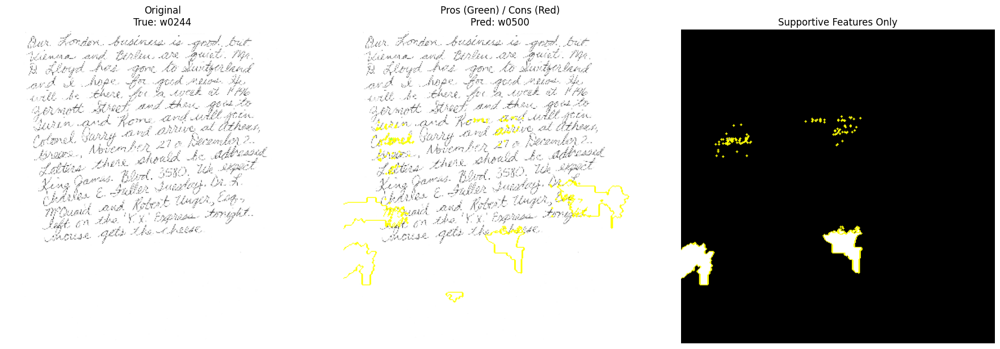

CPU times: user 29min 37s, sys: 19.5 s, total: 29min 56s
Wall time: 20min 54s


In [ ]:
%%time
explain_lime_from_dataset(test_ds, model, num_samples=750)

In [ ]:
def explain_lime_from_dataset(dataset, model, num_samples=1000):
    # 1. Grab a batch and pick a random image
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    idx = np.random.randint(0, len(images_np))
    raw_img = images_np[idx]
    true_label = class_names[labels_np[idx]]

    # De-normalize if needed for LIME
    if raw_img.min() < 0:
        raw_img_lime = (raw_img + 1.0) / 2.0
    else:
        raw_img_lime = raw_img

    # 2. Prediction function for LIME
    def predict_fn(instances):
        # Scale back to [-1, 1] for the actual model
        instances = (instances * 2.0) - 1.0
        preds = model.predict(instances, verbose=0)
        # LIME needs the probabilities
        return tf.nn.softmax(preds).numpy()

    # --- NEW: Get the model's actual top prediction first ---
    # This confirms if the model is actually wrong
    initial_preds = predict_fn(np.expand_dims(raw_img_lime, axis=0))
    pred_idx = np.argmax(initial_preds[0])
    pred_label = class_names[pred_idx]
    confidence = initial_preds[0][pred_idx]

    # 3. Run the explainer
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(
        raw_img_lime.astype('double'),
        predict_fn,
        top_labels=5,
        hide_color=0,
        num_samples=num_samples
    )

    # 4. Plotting
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Column 1: Original
    ax[0].imshow(scale_for_display(raw_img_lime))
    ax[0].set_title(f"Original Image\nTrue: {true_label}")
    ax[0].axis('off')

    # Column 2: Pros & Cons for the TOP PREDICTED class
    # We use explanation.top_labels[0] which LIME identifies as the strongest prediction
    top_lime_label = explanation.top_labels[0]
    temp_pn, mask_pn = explanation.get_image_and_mask(
        top_lime_label, positive_only=False, num_features=10, hide_rest=False
    )
    ax[1].imshow(mark_boundaries(scale_for_display(temp_pn), mask_pn))
    ax[1].set_title(f"LIME Pros/Cons\nPred: {class_names[top_lime_label]} ({confidence:.1%})")
    ax[1].axis('off')

    # Column 3: Supportive only
    temp_p, mask_p = explanation.get_image_and_mask(
        top_lime_label, positive_only=True, num_features=5, hide_rest=True
    )
    ax[2].imshow(mark_boundaries(scale_for_display(temp_p), mask_p))
    ax[2].set_title(f"Top 5 Features supporting\n{class_names[top_lime_label]}")
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()

  0%|          | 0/500 [00:00<?, ?it/s]

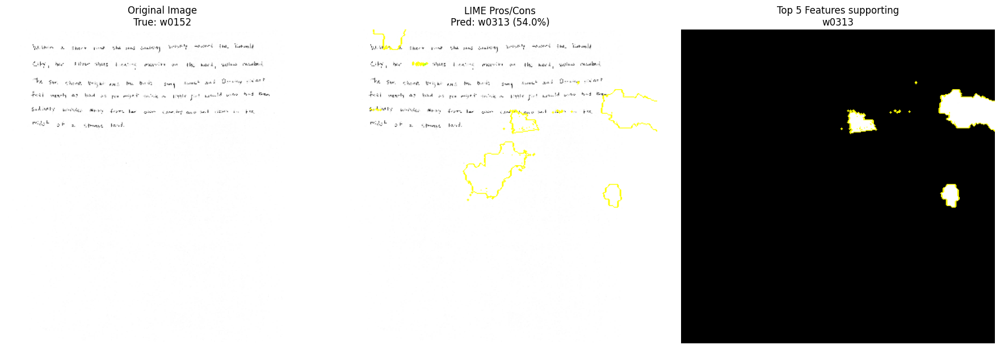

  0%|          | 0/500 [00:00<?, ?it/s]

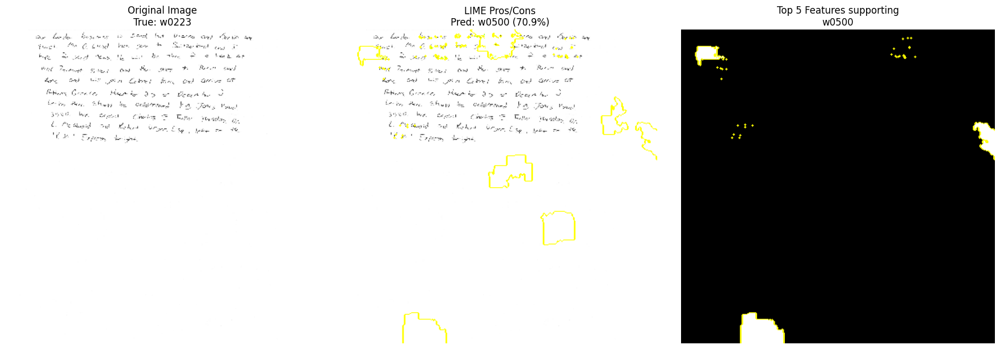

  0%|          | 0/500 [00:00<?, ?it/s]

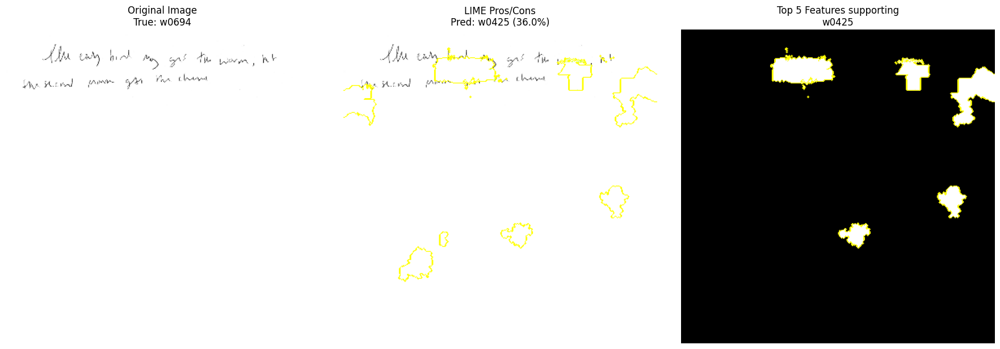

In [ ]:
explain_lime_from_dataset(test_ds, model, num_samples=500)
explain_lime_from_dataset(test_ds, model, num_samples=500)
explain_lime_from_dataset(test_ds, model, num_samples=500)

    True vs Predicted labels look weird

2/2 ━━━━━━━━━━━━━━━━━━━━ 92s 46s/step


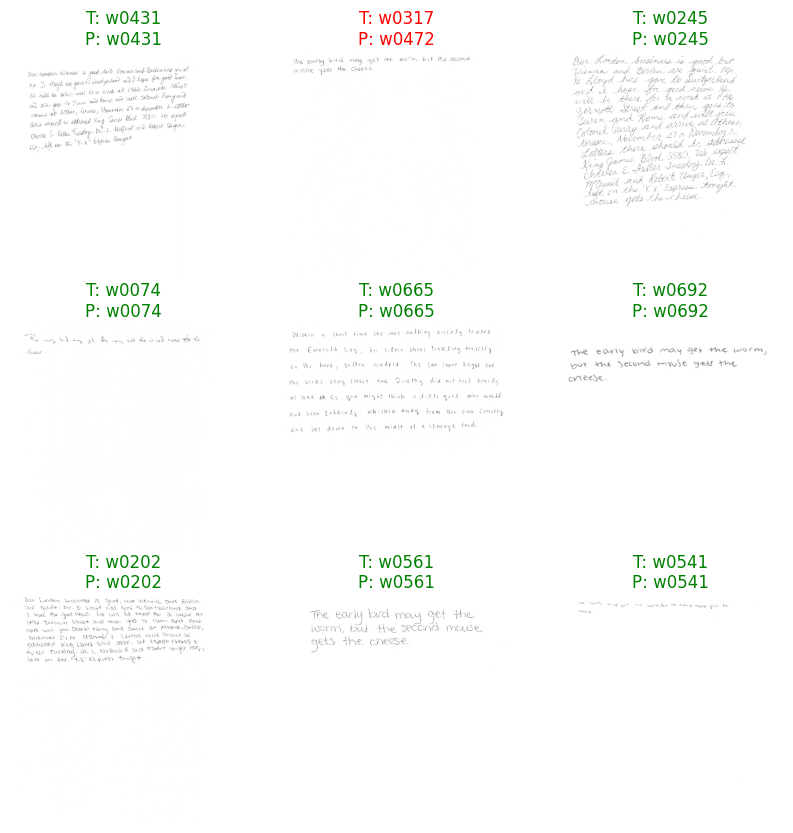

In [ ]:
for images, labels in test_ds.take(1):
    preds = model.predict(images)
    pred_labels = np.argmax(preds, axis=1)

    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        true_label = reload_data2.w_ids475[labels[i]]
        pred_label = reload_data2.w_ids475[pred_labels[i]]
        if true_label == pred_label:
            c = "green"
        else:
            c = "red"
        plt.title(f"T: {true_label}\nP: {pred_label}",color=c)
        plt.axis("off")
    plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 93s 48s/step


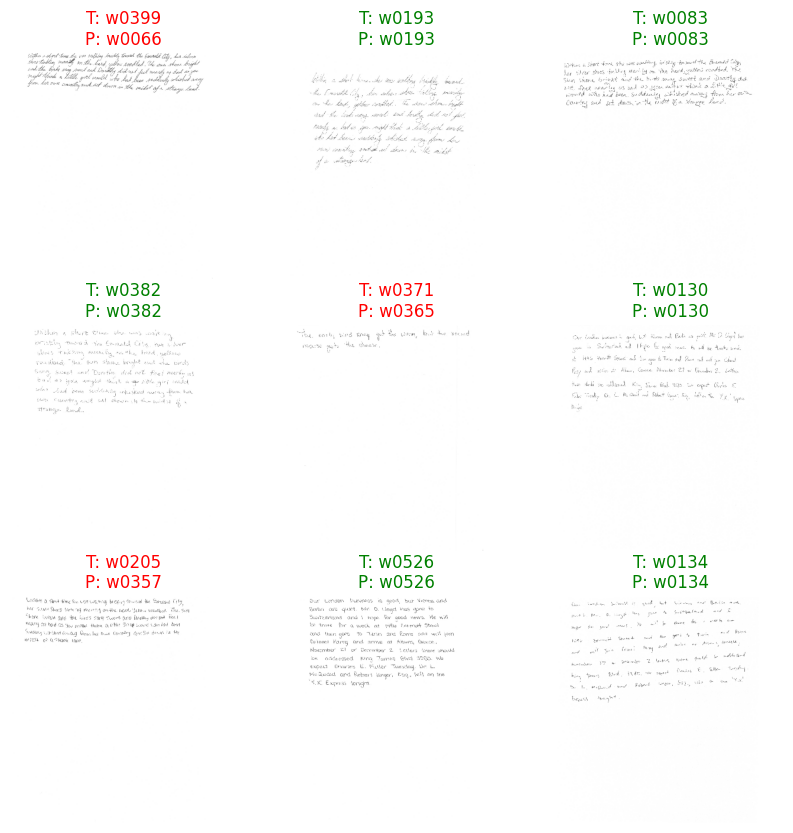

CPU times: user 2min 41s, sys: 3.92 s, total: 2min 44s
Wall time: 2min 27s


In [ ]:
%%time
for images, labels in test_ds.take(1):
    preds = model.predict(images)
    pred_labels = np.argmax(preds, axis=1)

    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        true_label = reload_data2.w_ids475[labels[i]]
        pred_label = reload_data2.w_ids475[pred_labels[i]]
        if true_label == pred_label:
            c = "green"
        else:
            c = "red"
        plt.title(f"T: {true_label}\nP: {pred_label}",color=c)
        plt.axis("off")
    plt.show()

# thirds2 (consistent)

## Data Loading

In [ ]:
! unzip -q Handwriting_Images_90sorted.zip

In [ ]:
shutil.rmtree
os.mkdir("thirds2_test") #all WOZ

In [ ]:
data_dir = "/content/Handwriting_Images"

for writer in os.listdir(data_dir):
    writer_path = f"{data_dir}/{writer}"
    try:
        for img in os.listdir(writer_path):
            if "WOZ" in img:
                os.makedirs(f"thirds2_test/{writer}",exist_ok=True)
                shutil.move(f"{writer_path}/{img}",f"thirds2_test/{writer}/{img}")
    except NotADirectoryError:
        pass

In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
        f"thirds2_test",
        labels='inferred',
        color_mode='rgb',
        image_size=(442,442),
        batch_size=BATCH_SIZE,
        )

Found 810 files belonging to 90 classes.


In [ ]:
model = load_model("/content/MobileNetV2_thirds2.keras")
model.summary()

Model: "mobilenet_thirds2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 14, 14, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 90)             │       115,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,603,856 (9.93 MB)

 Trainable params: 115,290 (450.35 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 230,582 (900.71 KB)

## Visualizations

2/2 ━━━━━━━━━━━━━━━━━━━━ 129s 65s/step


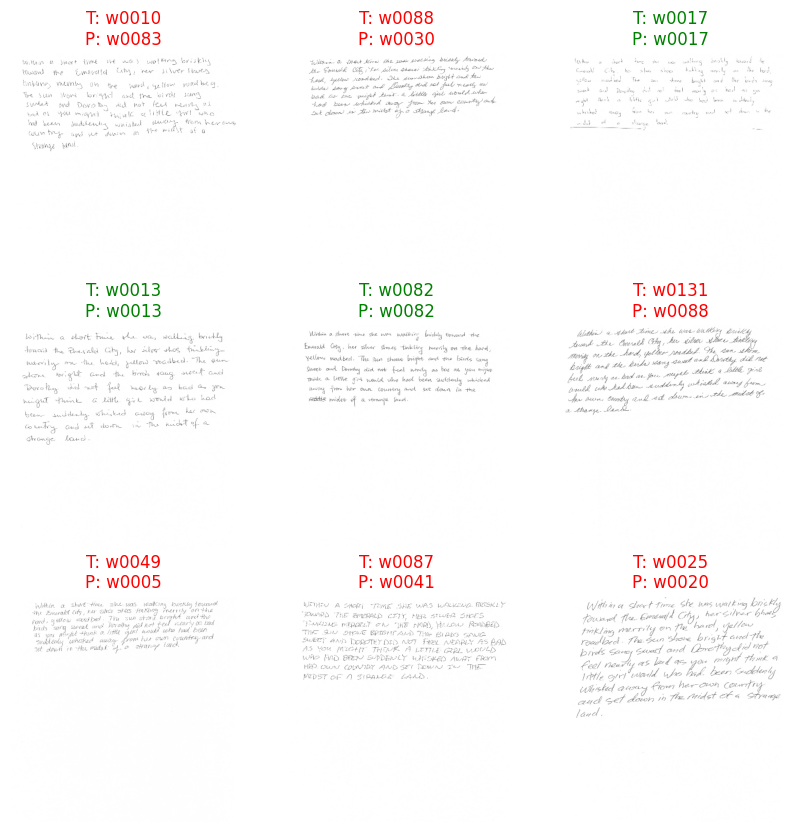

CPU times: user 3min 38s, sys: 4.59 s, total: 3min 43s
Wall time: 2min 24s


In [ ]:
%%time
for images, labels in test_ds.take(1):
    preds = model.predict(images)
    pred_labels = np.argmax(preds, axis=1)

    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        true_label = reload_data2.w_ids475[labels[i]]
        pred_label = reload_data2.w_ids475[pred_labels[i]]
        if true_label == pred_label:
            c = "green"
        else:
            c = "red"
        plt.title(f"T: {true_label}\nP: {pred_label}",color=c)
        plt.axis("off")
    plt.show()

ValueError: `inputs` not connected to `outputs`

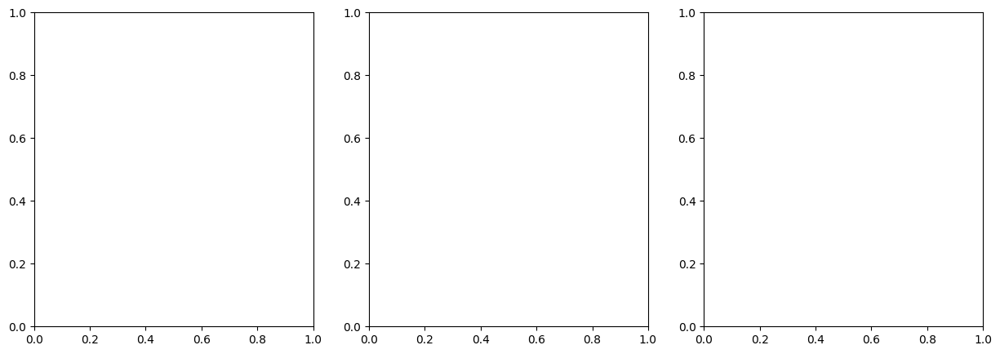

In [ ]:
%%time
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)
plot_gradcam_from_dataset(test_ds,model,3)

In [ ]:
%%time
print("NOTE: labelling is still wonky")
explain_lime_from_dataset(test_ds, model, num_samples=500)
explain_lime_from_dataset(test_ds, model, num_samples=500)
explain_lime_from_dataset(test_ds, model, num_samples=500)

NOTE: labelling is still wonky


  0%|          | 0/500 [00:00<?, ?it/s]

    ^^ Runtime disconnect

# CLAUDE

## Standardized Inputs (allclass2)

### Data Loading

In [4]:
model = load_model("/content/MobileNetV2_allclass2.keras")
model.summary()

Model: "mobilenet_allclass2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

In [6]:
! unzip -q /content/AllClass2_test.zip

In [7]:
data_dir = "/content/content/New_Data"
IMAGE_SIZE = (384,384)
BATCH_SIZE = 64

In [8]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    label_mode='int',
    color_mode='rgb',
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    )

Found 2850 files belonging to 475 classes.


In [9]:
model_class_names = test_ds.class_names
print(model_class_names[:10])

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012']


### Function

In [39]:
import numpy as np
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
import matplotlib.cm as cm


# ──────────────────────────────────────────────────────────────────────────────
# DEBUGGING HELPER
# ──────────────────────────────────────────────────────────────────────────────
def inspect_model(model):
    print("=== Wrapper model layers ===")
    for i, layer in enumerate(model.layers):
        out_shape = getattr(layer, "output_shape", "?")
        is_submodel = isinstance(layer, tf.keras.Model)
        print(f"  [{i:2d}] {layer.name:40s}  output={out_shape}{'  <- SUB-MODEL' if is_submodel else ''}")
        if is_submodel:
            print(f"       Last 10 layers of '{layer.name}':")
            for sub in layer.layers[-10:]:
                print(f"         {sub.name:40s}  output={getattr(sub, 'output_shape', '?')}")


# ──────────────────────────────────────────────────────────────────────────────
# GRAD-CAM HEATMAP
# Model structure:
#   input -> mobilenetv2 (spatial 12x12x1280) -> dropout -> GAP -> dropout -> dense
#   backbone.output returns a list([tensor(1,12,12,1280)]) — unwrap with [0]
# ──────────────────────────────────────────────────────────────────────────────
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    """
    Parameters
    ----------
    img_array            : np.ndarray  shape (1, H, W, 3), pre-processed
    model                : full wrapper Keras model
    last_conv_layer_name : str - layer name inside the backbone, e.g. "out_relu"

    Returns
    -------
    heatmap : np.ndarray  shape (h, w),  values in [0, 1]
    """

    # 1. Find the backbone and its index in the wrapper
    backbone = None
    backbone_idx = None
    for i, layer in enumerate(model.layers):
        if isinstance(layer, tf.keras.Model):
            backbone = layer
            backbone_idx = i
            break
    if backbone is None:
        raise ValueError("No nested sub-model (backbone) found inside `model`.")

    # 2. Get the target conv layer from inside the backbone
    try:
        conv_layer = backbone.get_layer(last_conv_layer_name)
    except ValueError:
        names = [l.name for l in backbone.layers]
        raise ValueError(
            f"Layer '{last_conv_layer_name}' not found in backbone '{backbone.name}'.\n"
            f"Backbone layers:\n" + "\n".join(f"  {n}" for n in names)
        )

    # 3. Build grad-model: backbone-input -> [conv_output, backbone_output]
    grad_model = tf.keras.Model(
        inputs=backbone.inputs,
        outputs=[conv_layer.output, backbone.output],
    )

    # 4. All wrapper layers after the backbone (dropout, GAP, dropout, dense)
    head_layers = model.layers[backbone_idx + 1:]

    # 5. Forward pass under GradientTape
    with tf.GradientTape() as tape:
        img_tensor = tf.cast(img_array, tf.float32)

        outputs = grad_model(img_tensor)
        conv_output  = outputs[0]      # tensor (1, 12, 12, 1280)

        # backbone.output comes back as a list([tensor]) — unwrap it
        backbone_out = outputs[1]
        if isinstance(backbone_out, (list, tuple)):
            backbone_out = backbone_out[0]   # now a proper tensor (1, 12, 12, 1280)

        # Pass through head: dropout -> GAP -> dropout -> dense
        x = backbone_out
        for layer in head_layers:
            x = layer(x)
        final_preds = x              # (1, num_classes)

        # Plain Python int index — avoids all tensor-indexing issues
        pred_index = int(tf.argmax(final_preds[0], axis=-1).numpy())
        class_channel = final_preds[0, pred_index]   # scalar

    # 6. Gradients
    grads = tape.gradient(class_channel, conv_output)   # (1, 12, 12, 1280)
    if grads is None:
        raise RuntimeError("Gradients are None — ensure the target layer is in the forward path.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))   # (1280,)

    conv_out = conv_output[0]                               # (12, 12, 1280)
    heatmap  = conv_out @ pooled_grads[..., tf.newaxis]    # (12, 12, 1)
    heatmap  = tf.squeeze(heatmap)                         # (12, 12)

    # ReLU + normalise to [0, 1]
    heatmap = tf.maximum(heatmap, 0)
    max_val = tf.math.reduce_max(heatmap)
    if max_val > 0:
        heatmap = heatmap / max_val

    return heatmap.numpy()


# ──────────────────────────────────────────────────────────────────────────────
# OVERLAY HELPER
# ──────────────────────────────────────────────────────────────────────────────
def overlay_heatmap(img_single, heatmap, alpha=0.35):
    """
    img_single : np.ndarray (H, W, 3)  any value range
    heatmap    : np.ndarray (h, w)     values [0, 1]
    Returns    : np.ndarray (H, W, 3)  float [0, 1]
    """
    H, W = img_single.shape[:2]

    lo, hi = img_single.min(), img_single.max()
    display = (img_single - lo) / (hi - lo + 1e-7)

    heatmap_resized = tf.image.resize(
        heatmap[..., tf.newaxis], (H, W)
    ).numpy()[..., 0]

    jet = cm.get_cmap("jet")
    jet_rgb = jet(heatmap_resized)[..., :3]

    blended = jet_rgb * alpha + display * (1 - alpha)
    return np.clip(blended, 0, 1)


# ──────────────────────────────────────────────────────────────────────────────
# MAIN PLOT FUNCTION
# ──────────────────────────────────────────────────────────────────────────────
def plot_gradcam_from_dataset(
    dataset,
    model,
    last_conv_layer_name,
    n=4,
    alpha=0.35,
    figsize=(15, 12),
):
    """
    Randomly sample `n` images from the first batch of `dataset`,
    overlay Grad-CAM, and display top-3 predictions vs. true label.

    Green title -> true label in top-3
    Red title   -> true label NOT in top-3
    """
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    n = min(n, len(images_np))
    indices = np.random.choice(len(images_np), n, replace=False)

    cols = int(np.ceil(np.sqrt(n)))
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).flatten()

    for plot_i, idx in enumerate(indices):
        img = images_np[idx : idx + 1]
        true_name = class_names[labels_np[idx]]

        # predictions
        raw_preds = model.predict(img, verbose=0)
        probs = tf.nn.softmax(raw_preds[0]).numpy()
        top3_idx = np.argsort(probs)[::-1][:3]
        top3_names = [class_names[j] for j in top3_idx]
        top3_confs = [f"{probs[j]:.2%}" for j in top3_idx]

        # Grad-CAM
        heatmap = make_gradcam_heatmap(img, model, last_conv_layer_name)
        overlay = overlay_heatmap(img[0], heatmap, alpha=alpha)

        ax = axes[plot_i]
        ax.imshow(overlay)
        ax.axis("off")

        in_top3 = true_name in top3_names
        overall_color = "green" if in_top3 else "red"

        title_lines = [f"True: {true_name}"]
        for rank, (name, conf) in enumerate(zip(top3_names, top3_confs), 1):
            suffix = " [CORRECT]" if name == true_name else ""
            title_lines.append(f"{rank}. {name} ({conf}){suffix}")

        ax.set_title(
            "\n".join(title_lines),
            color=overall_color,
            fontsize=10,
            loc="left",
            linespacing=1.3,
        )

    for ax in axes[n:]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()


# ──────────────────────────────────────────────────────────────────────────────
# USAGE
# ──────────────────────────────────────────────────────────────────────────────
# inspect_model(model)   # run once to verify structure
#
# plot_gradcam_from_dataset(
#     dataset=val_dataset,
#     model=model,
#     last_conv_layer_name="out_relu",
#     n=4,
# )

In [32]:
inspect_model(model)

=== Wrapper model layers ===
  [ 0] input_layer_1                             output=?
  [ 1] mobilenetv2_1.00_224                      output=(None, 12, 12, 1280)  <- SUB-MODEL
       Last 10 layers of 'mobilenetv2_1.00_224':
         block_16_expand_BN                        output=?
         block_16_expand_relu                      output=?
         block_16_depthwise                        output=?
         block_16_depthwise_BN                     output=?
         block_16_depthwise_relu                   output=?
         block_16_project                          output=?
         block_16_project_BN                       output=?
         Conv_1                                    output=?
         Conv_1_bn                                 output=?
         out_relu                                  output=?
  [ 2] dropout                                   output=?
  [ 3] global_average_pooling2d                  output=?
  [ 4] dropout_1                                 output=?

/tmp/ipykernel_379/2330180047.py:132: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


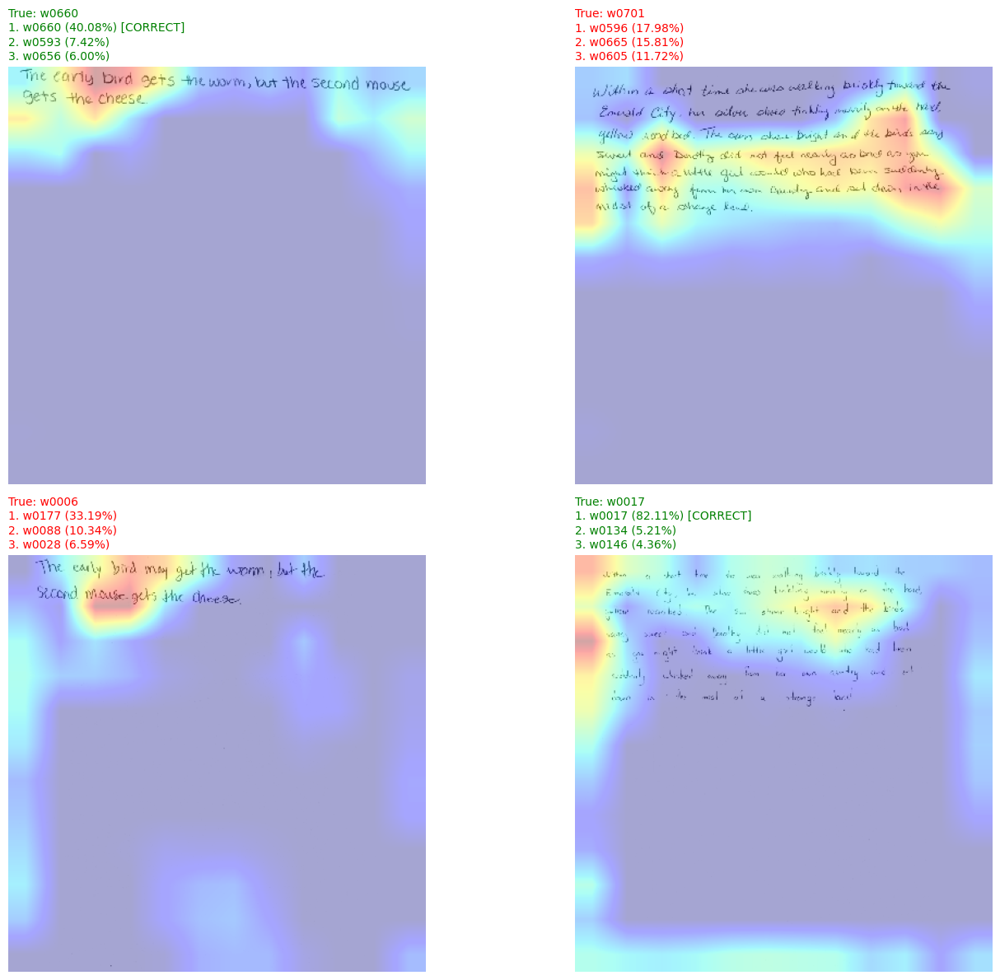

CPU times: user 22.2 s, sys: 468 ms, total: 22.7 s
Wall time: 17.8 s


In [35]:
%%time
plot_gradcam_from_dataset(
     dataset=test_ds,
     model=model,
     last_conv_layer_name="out_relu",
     n=4,
 )

/tmp/ipykernel_379/271248428.py:132: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


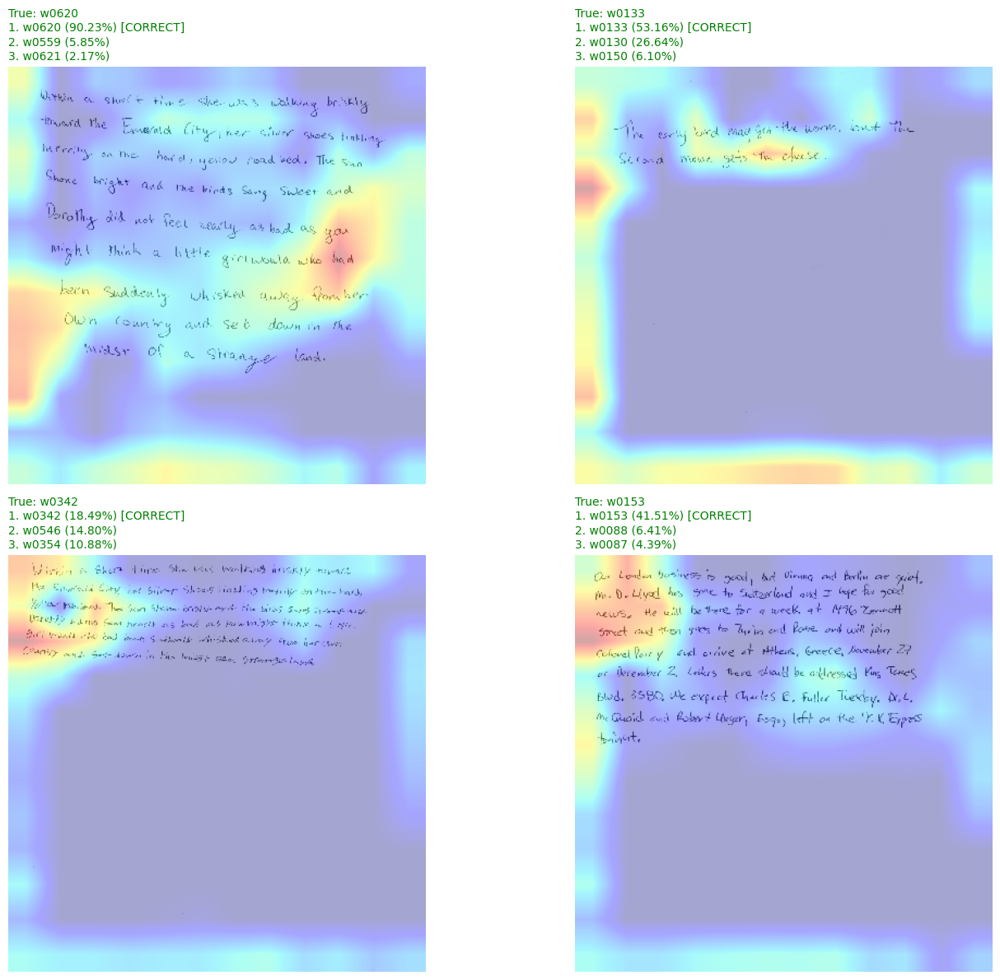

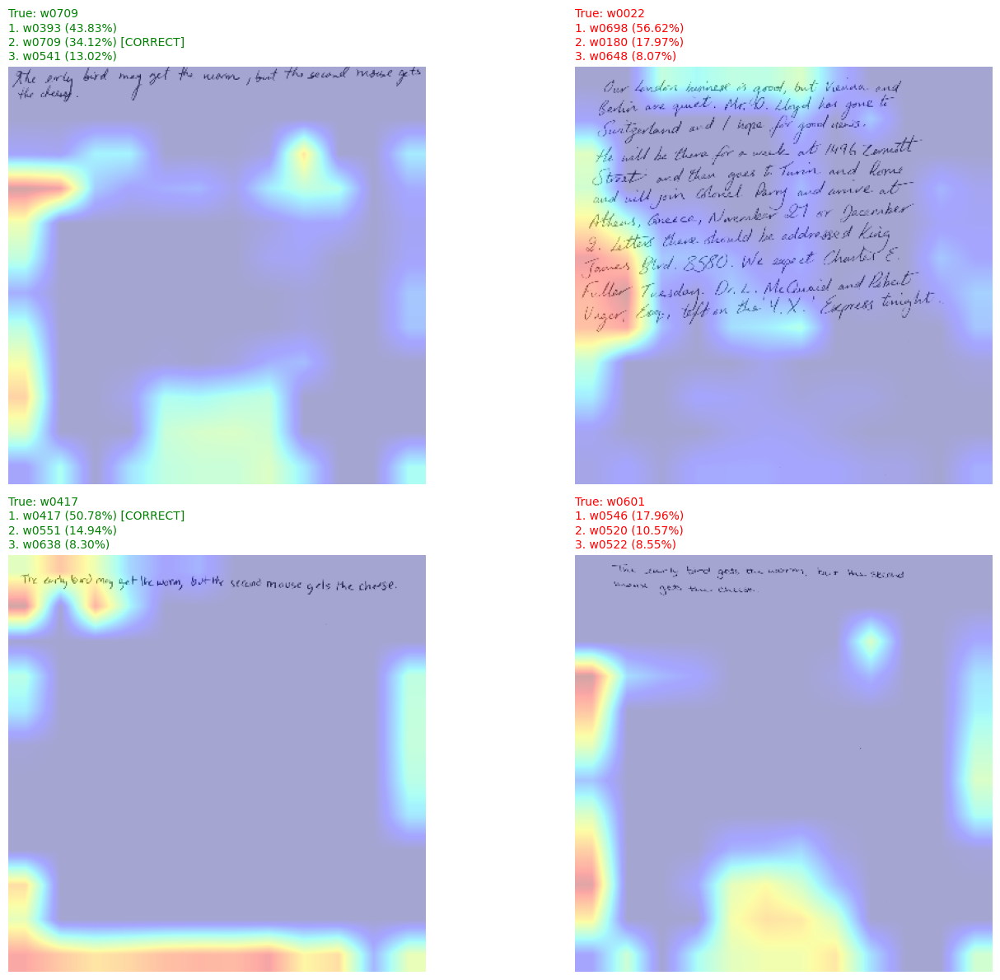

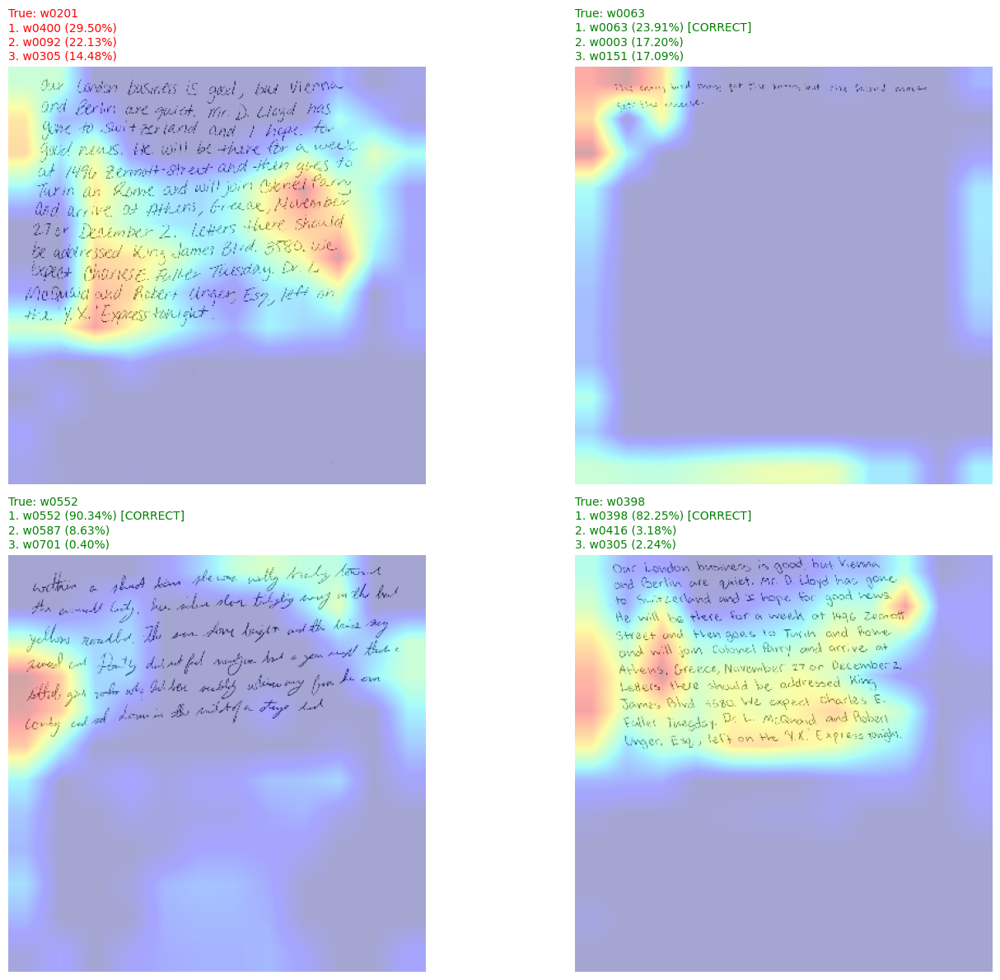

CPU times: user 1min 5s, sys: 1.29 s, total: 1min 6s
Wall time: 51.2 s


In [40]:
%%time
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)

/tmp/ipykernel_379/271248428.py:132: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


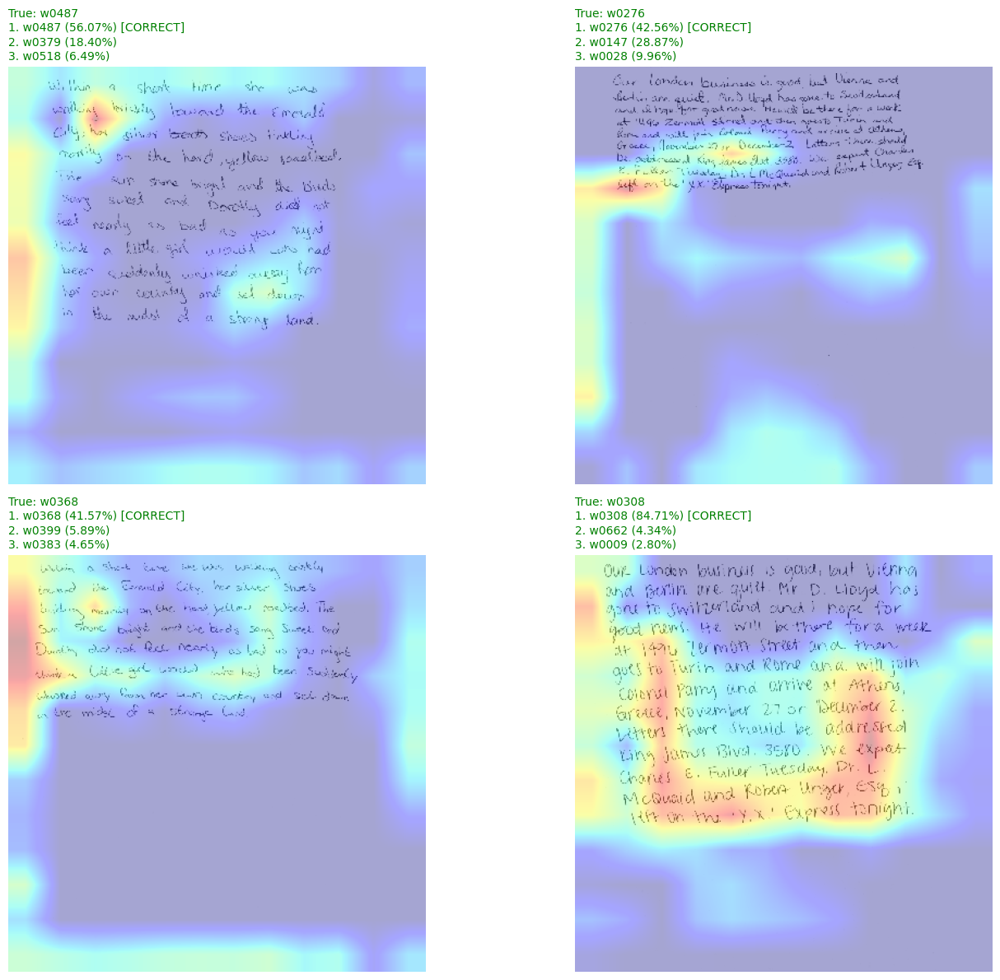

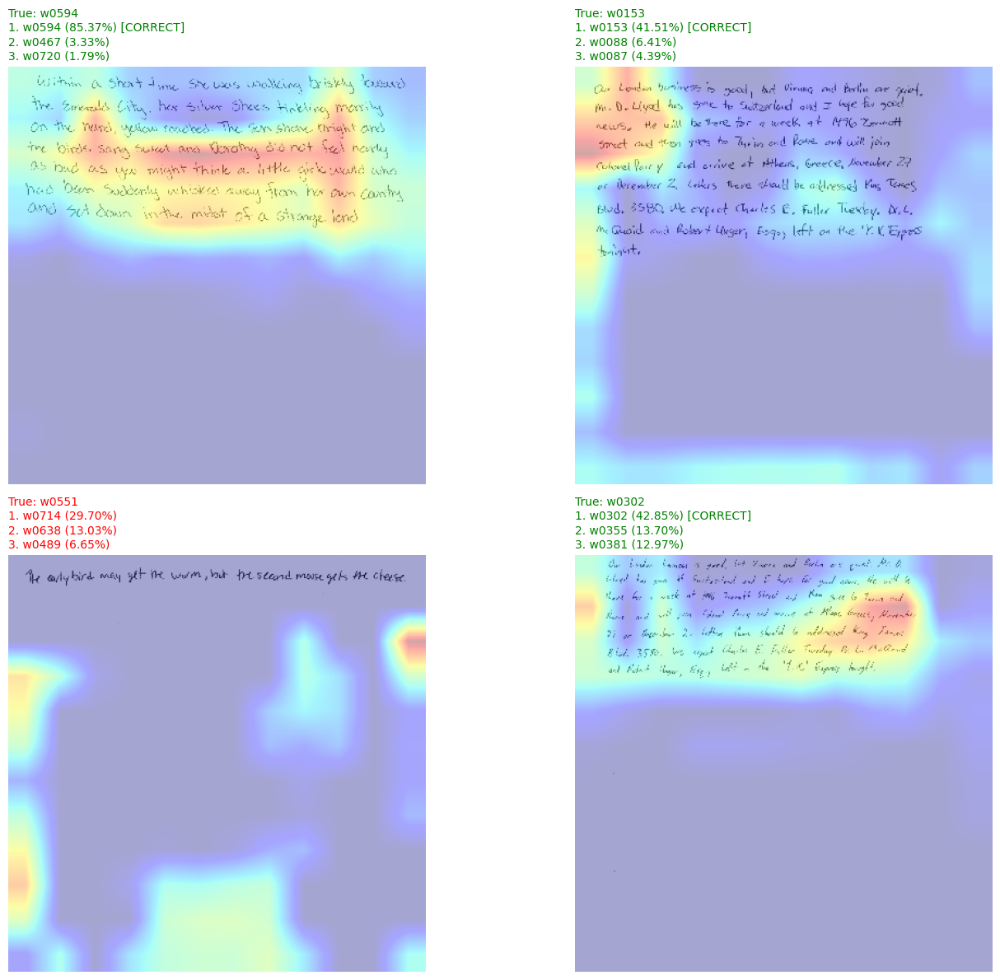

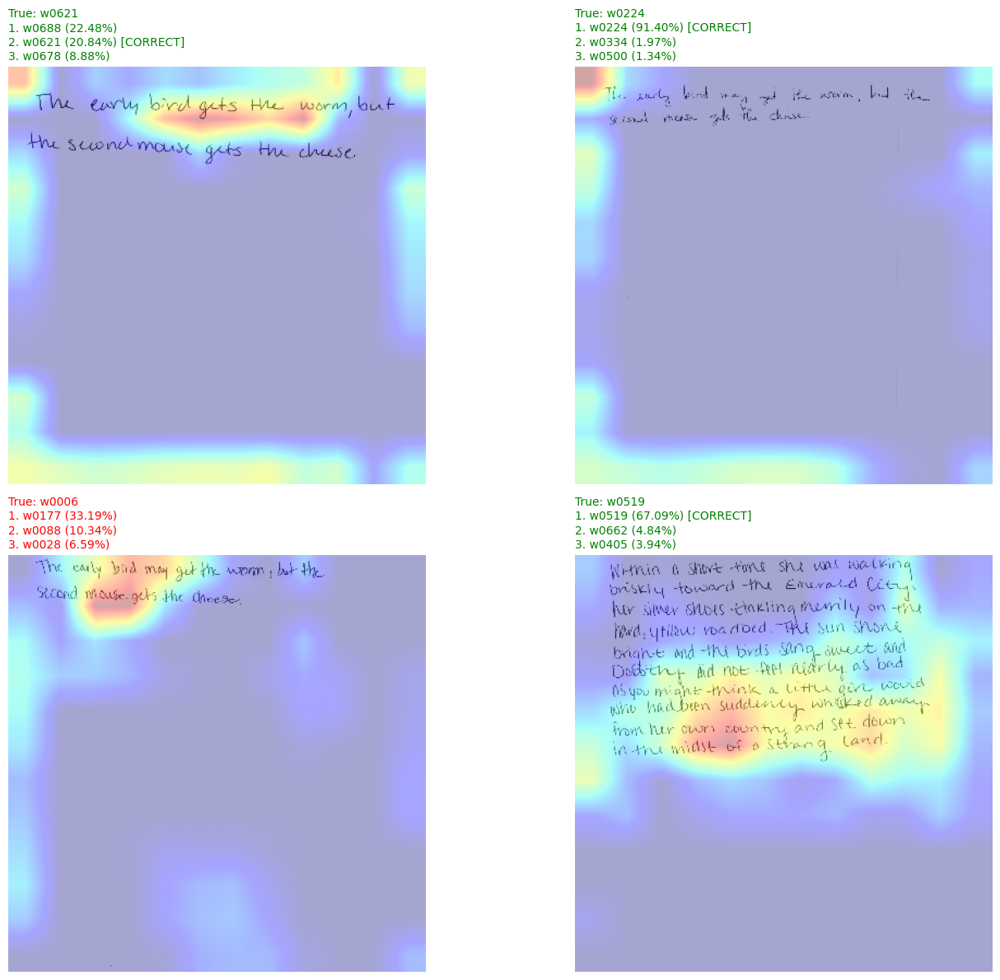

CPU times: user 1min 5s, sys: 1.54 s, total: 1min 7s
Wall time: 1min 3s


In [41]:
%%time
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)

/tmp/ipykernel_379/271248428.py:132: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


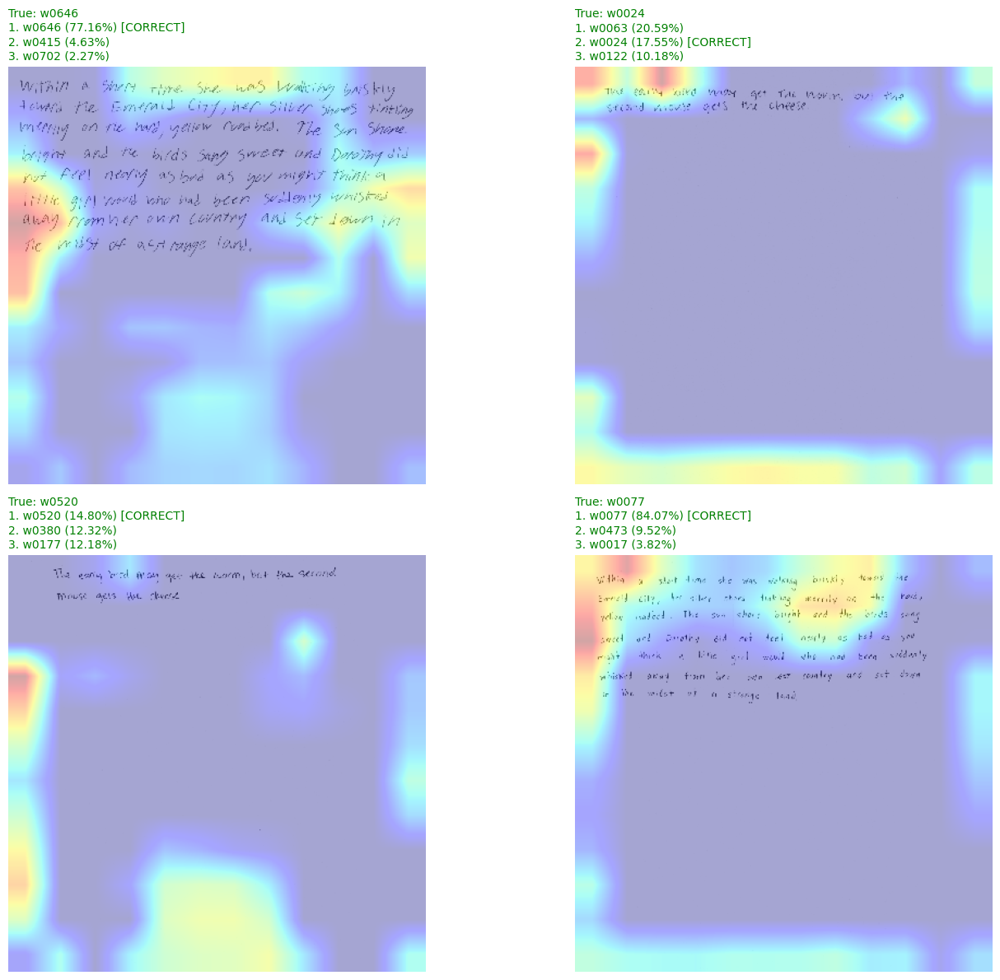

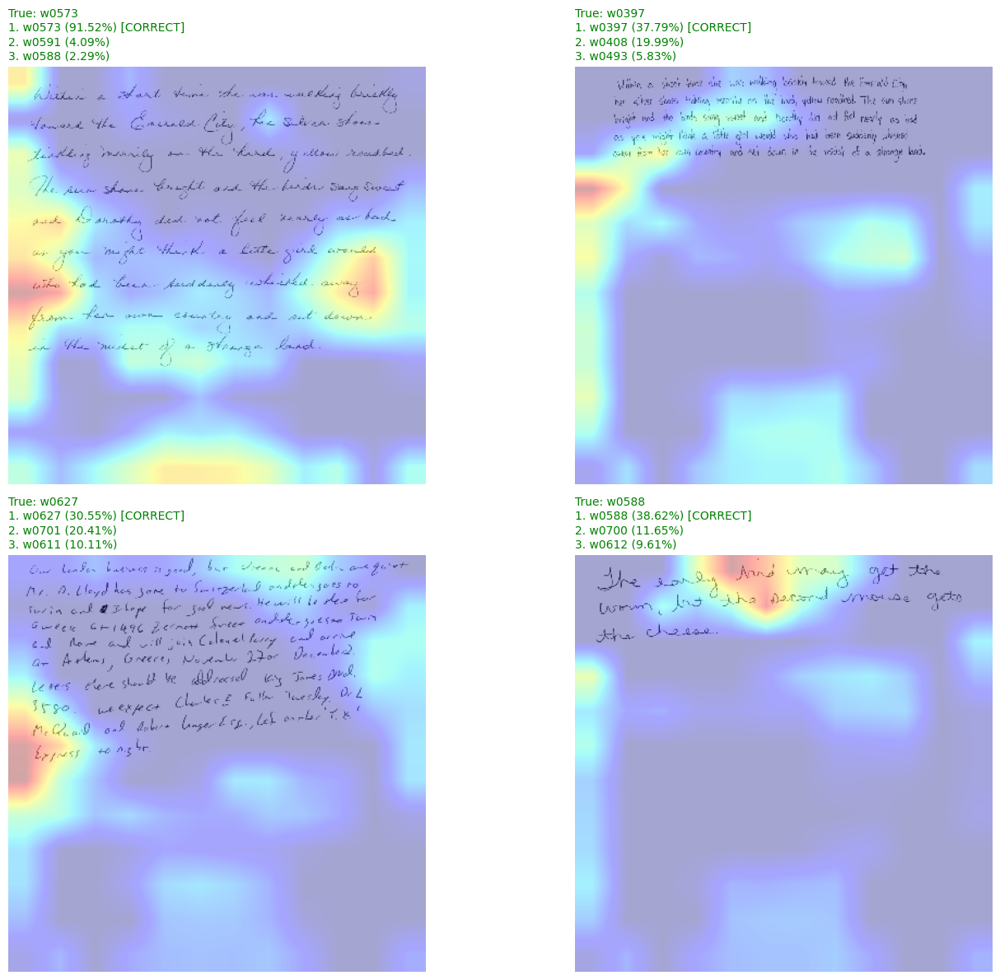

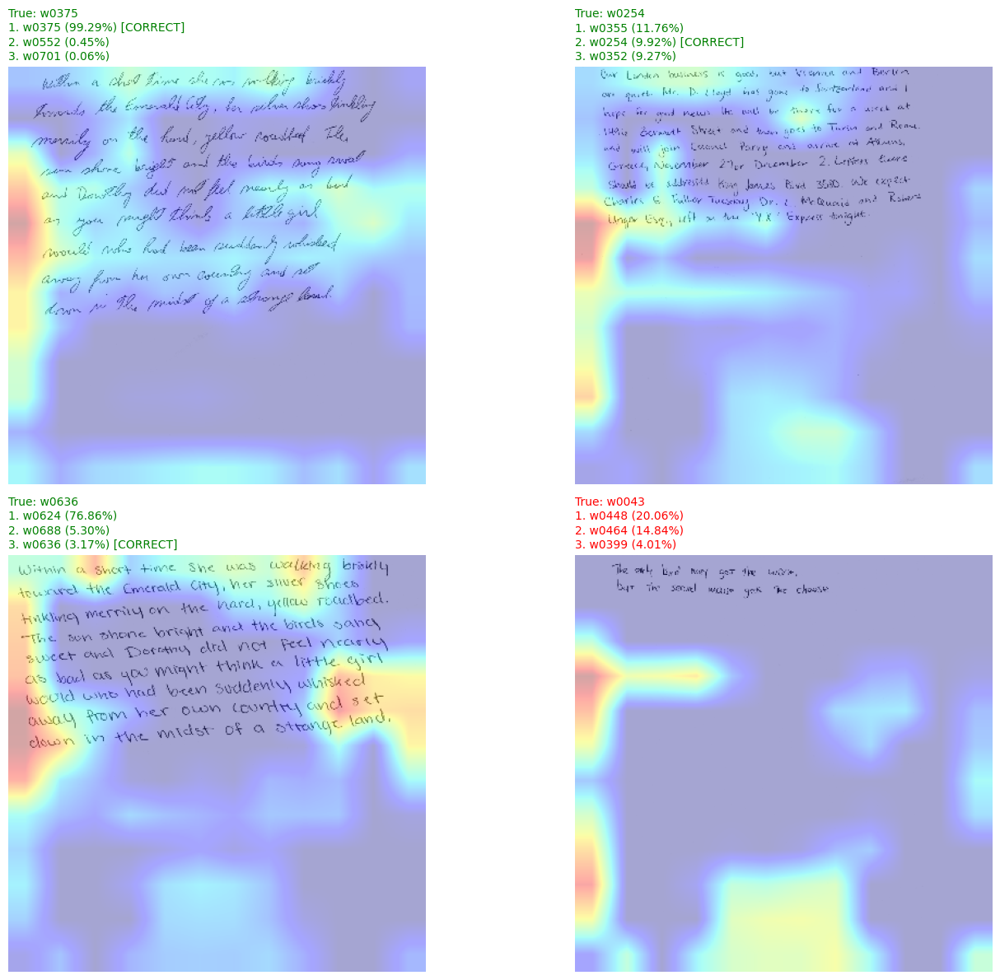

CPU times: user 1min 5s, sys: 1.77 s, total: 1min 7s
Wall time: 59.8 s


In [42]:
%%time
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)

### LIME

In [73]:
import subprocess
import sys

def _ensure_package(package, import_name=None):
    """Install package if not already available."""
    import_name = import_name or package
    try:
        __import__(import_name)
    except ImportError:
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

_ensure_package("lime")
_ensure_package("scikit-image", "skimage")

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from lime import lime_image
from skimage.segmentation import mark_boundaries


# ──────────────────────────────────────────────────────────────────────────────
# SHARED HELPERS
# ──────────────────────────────────────────────────────────────────────────────

def inspect_model(model):
    """Print wrapper model layers and last 10 layers of any sub-model."""
    print("=== Wrapper model layers ===")
    for i, layer in enumerate(model.layers):
        out_shape = getattr(layer, "output_shape", "?")
        is_submodel = isinstance(layer, tf.keras.Model)
        print(f"  [{i:2d}] {layer.name:40s}  output={out_shape}{'  <- SUB-MODEL' if is_submodel else ''}")
        if is_submodel:
            print(f"       Last 10 layers of '{layer.name}':")
            for sub in layer.layers[-10:]:
                print(f"         {sub.name:40s}  output={getattr(sub, 'output_shape', '?')}")


def _unwrap_dataset(dataset):
    """
    Unwrap prefetch/cache/repeat/shuffle wrappers to access .class_names.
    Safe to call on a plain dataset too — returns it unchanged.
    """
    ds = dataset
    while not hasattr(ds, 'class_names'):
        if not hasattr(ds, '_input_dataset'):
            raise AttributeError(
                "Could not find .class_names — dataset may not be a "
                "tf.data.Dataset created with image_dataset_from_directory()."
            )
        ds = ds._input_dataset
    return ds


def scale_for_display(img):
    """Scale any array to [0, 1] for imshow."""
    img = np.array(img, dtype=float)
    lo, hi = img.min(), img.max()
    if hi > lo:
        return (img - lo) / (hi - lo)
    return img


def _to_lime_range(img):
    img = np.array(img, dtype=np.float32)
    if img.max() > 1.0:
        # [0, 255] range
        return np.clip(img / 255.0, 0.0, 1.0)
    elif img.min() < 0:
        # [-1, 1] MobileNetV2 range
        return np.clip((img + 1.0) / 2.0, 0.0, 1.0)
    else:
        # already [0, 1]
        return np.clip(img, 0.0, 1.0)


def _get_backbone_and_head(model):
    """Returns (backbone, head_layers) for a wrapper model."""
    for i, layer in enumerate(model.layers):
        if isinstance(layer, tf.keras.Model):
            return layer, model.layers[i + 1:]
    raise ValueError("No nested sub-model (backbone) found inside `model`.")


def _run_model(model, img_array):
    """Full forward pass; returns softmax probs as 1-D numpy array (num_classes,)."""
    raw = model.predict(img_array, verbose=0)
    return tf.nn.softmax(raw[0]).numpy()


# ──────────────────────────────────────────────────────────────────────────────
# GRAD-CAM
# ──────────────────────────────────────────────────────────────────────────────

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Parameters
    ----------
    img_array            : np.ndarray (1, H, W, 3), pre-processed
    model                : full wrapper Keras model
    last_conv_layer_name : str  - layer name inside the backbone, e.g. "out_relu"
    pred_index           : int or None - class to explain; None = argmax

    Returns
    -------
    heatmap : np.ndarray (h, w), values in [0, 1]
    """
    backbone, head_layers = _get_backbone_and_head(model)

    try:
        conv_layer = backbone.get_layer(last_conv_layer_name)
    except ValueError:
        names = [l.name for l in backbone.layers]
        raise ValueError(
            f"Layer '{last_conv_layer_name}' not found in '{backbone.name}'.\n"
            f"Available: {names}"
        )

    grad_model = tf.keras.Model(
        inputs=backbone.inputs,
        outputs=[conv_layer.output, backbone.output],
    )

    with tf.GradientTape() as tape:
        img_tensor = tf.cast(img_array, tf.float32)
        outputs = grad_model(img_tensor, training=False)  # training=False: dropout off

        conv_output = outputs[0]
        backbone_out = outputs[1]
        if isinstance(backbone_out, (list, tuple)):
            backbone_out = backbone_out[0]

        # Pass through head with training=False so dropout doesn't zero gradients
        x = backbone_out
        for layer in head_layers:
            x = layer(x, training=False)
        final_preds = x   # (1, num_classes)

        if pred_index is None:
            pred_index = int(tf.argmax(final_preds[0], axis=-1).numpy())
        class_channel = final_preds[0, pred_index]

    grads = tape.gradient(class_channel, conv_output)
    if grads is None:
        raise RuntimeError("Gradients are None — check the target layer is in the forward path.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_out = conv_output[0]
    heatmap = conv_out @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0)
    max_val = tf.math.reduce_max(heatmap)
    if max_val > 0:
        heatmap = heatmap / max_val





    return heatmap.numpy()


def overlay_heatmap(img_single, heatmap, alpha=0.4):
    """
    Overlay a [0,1] heatmap onto an image (any value range).
    Returns float [0,1] RGB array.
    """
    H, W = img_single.shape[:2]
    display = scale_for_display(img_single)

    heatmap_resized = tf.image.resize(
        heatmap[..., tf.newaxis], (H, W)
    ).numpy()[..., 0]

    jet_rgb = cm.get_cmap("jet")(heatmap_resized)[..., :3]
    blended = jet_rgb * alpha + display * (1 - alpha)
    return np.clip(blended, 0, 1)


# ──────────────────────────────────────────────────────────────────────────────
# GRAD-CAM 4-UP GRID
# ──────────────────────────────────────────────────────────────────────────────

def plot_gradcam_from_dataset(
    dataset,
    model,
    last_conv_layer_name,
    n=4,
    alpha=0.4,
    figsize=(15, 12),
):
    """
    Randomly sample n images from the first batch, overlay Grad-CAM,
    show top-3 predictions vs. true label.
    Green title -> true label in top-3 | Red -> not in top-3
    """
    base_ds = _unwrap_dataset(dataset)
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = base_ds.class_names

    n = min(n, len(images_np))
    indices = np.random.choice(len(images_np), n, replace=False)

    cols = int(np.ceil(np.sqrt(n)))
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).flatten()

    for plot_i, idx in enumerate(indices):
        img = images_np[idx : idx + 1]
        true_name = class_names[labels_np[idx]]

        probs = _run_model(model, img)
        top3_idx = np.argsort(probs)[::-1][:3]
        top3_names = [class_names[j] for j in top3_idx]
        top3_confs = [f"{probs[j]:.2%}" for j in top3_idx]

        heatmap = make_gradcam_heatmap(img, model, last_conv_layer_name)
        overlay = overlay_heatmap(img[0], heatmap, alpha=alpha)

        ax = axes[plot_i]
        ax.imshow(overlay)
        ax.axis("off")

        in_top3 = true_name in top3_names
        title_lines = [f"True: {true_name}"]
        for rank, (name, conf) in enumerate(zip(top3_names, top3_confs), 1):
            suffix = " [CORRECT]" if name == true_name else ""
            title_lines.append(f"{rank}. {name} ({conf}){suffix}")

        ax.set_title(
            "\n".join(title_lines),
            color="green" if in_top3 else "red",
            fontsize=10,
            loc="left",
            linespacing=1.3,
        )

    for ax in axes[n:]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()


# ──────────────────────────────────────────────────────────────────────────────
# LIME + GRAD-CAM  2×2 PANEL
# ──────────────────────────────────────────────────────────────────────────────

def plot_ultimate_explanation(
    dataset,
    model,
    last_conv_layer_name,
    num_samples=500,
    figsize=(14, 12),
):
    """
    2×2 panel for a single randomly-sampled image:
      [0,0] Original image + true label
      [0,1] LIME: pros (green) and cons (red)
      [1,0] LIME: supportive features only
      [1,1] Grad-CAM overlay
    """

    # ── 1. Sample one image ──────────────────────────────────────────────────
    base_ds = _unwrap_dataset(dataset)
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = base_ds.class_names

    idx = np.random.randint(0, len(images_np))
    img_tensor = images_np[idx : idx + 1]   # (1, H, W, 3) preprocessed
    true_label = class_names[labels_np[idx]]

    # ── 2. Model predictions ─────────────────────────────────────────────────
    probs = _run_model(model, img_tensor)
    pred_idx = int(np.argmax(probs))
    pred_label = class_names[pred_idx]
    confidence = probs[pred_idx]

    # ── 3. Convert to [0,1] for LIME and display ─────────────────────────────
    # _to_lime_range undoes [-1,1] MobileNetV2 preprocessing -> [0,1]
    lime_img = _to_lime_range(img_tensor[0])   # (H, W, 3) in [0, 1]

    # ── 4. LIME predict_fn ───────────────────────────────────────────────────
    def predict_fn(instances):
        # LIME gives [0,1] — scale back to [0,255] to match dataset/model expectation
        instances = (instances * 255.0).astype(np.float32)
        preds = model.predict(instances, verbose=0)
        return tf.nn.softmax(preds).numpy()

    # ── 5. Run LIME ──────────────────────────────────────────────────────────
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(
        lime_img.astype("double"),
        predict_fn,
        top_labels=5,
        hide_color=0,
        num_samples=num_samples,
    )

    lime_top_class_idx = explanation.top_labels[0]
    lime_top_class_name = class_names[lime_top_class_idx]

    # ── 6. Grad-CAM ──────────────────────────────────────────────────────────
    heatmap = make_gradcam_heatmap(
        img_tensor, model, last_conv_layer_name, pred_index=pred_idx
    )
    gradcam_overlay = overlay_heatmap(img_tensor[0], heatmap, alpha=0.4)

    # ── 7. LIME images  ──────────────────────────────────────────────────────
    # get_image_and_mask returns an image in the same range as the input to
    # explain_instance, which is our lime_img ([0, 1]).
    # We display it directly — no further scaling needed except mark_boundaries.
    temp_pn, mask_pn = explanation.get_image_and_mask(
        lime_top_class_idx,
        positive_only=False,
        num_features=10,
        hide_rest=False,
    )
    temp_p, mask_p = explanation.get_image_and_mask(
        lime_top_class_idx,
        positive_only=True,
        num_features=5,
        hide_rest=True,
    )





    temp_pn, mask_pn = explanation.get_image_and_mask(
    lime_top_class_idx, positive_only=False, num_features=10, hide_rest=False
    )








    # ── 8. Plot ───────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(2, 2, figsize=figsize)

    # [0,0] Original
    axes[0, 0].imshow(lime_img)
    axes[0, 0].set_title(f"Original\nTrue: {true_label}", fontsize=12)
    axes[0, 0].axis("off")

    # [0,1] LIME pros & cons — temp_pn is already [0,1], clip for safety
    axes[0, 1].imshow(mark_boundaries(np.clip(temp_pn, 0, 1), mask_pn))
    axes[0, 1].set_title(
        f"LIME: Pros (Green) / Cons (Red)\n"
        f"LIME top: {lime_top_class_name}  |  Model: {pred_label} ({confidence:.1%})",
        fontsize=11,
    )
    axes[0, 1].axis("off")

    # [1,0] LIME supportive only
    axes[1, 0].imshow(mark_boundaries(np.clip(temp_p, 0, 1), mask_p))
    axes[1, 0].set_title("LIME: Top Supportive Features", fontsize=12)
    axes[1, 0].axis("off")

    # [1,1] Grad-CAM
    axes[1, 1].imshow(gradcam_overlay)
    axes[1, 1].set_title(f"Grad-CAM: {last_conv_layer_name}", fontsize=12)
    axes[1, 1].axis("off")

    plt.tight_layout()
    plt.show()


# ──────────────────────────────────────────────────────────────────────────────
# USAGE
# ──────────────────────────────────────────────────────────────────────────────
# inspect_model(model)
#
# plot_gradcam_from_dataset(val_dataset, model, last_conv_layer_name="out_relu", n=4)
#
# plot_ultimate_explanation(val_dataset, model, last_conv_layer_name="out_relu", num_samples=1000)

  0%|          | 0/500 [00:00<?, ?it/s]

/tmp/ipykernel_379/1969488672.py:138: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet_rgb = cm.get_cmap("jet")(heatmap_resized)[..., :3]


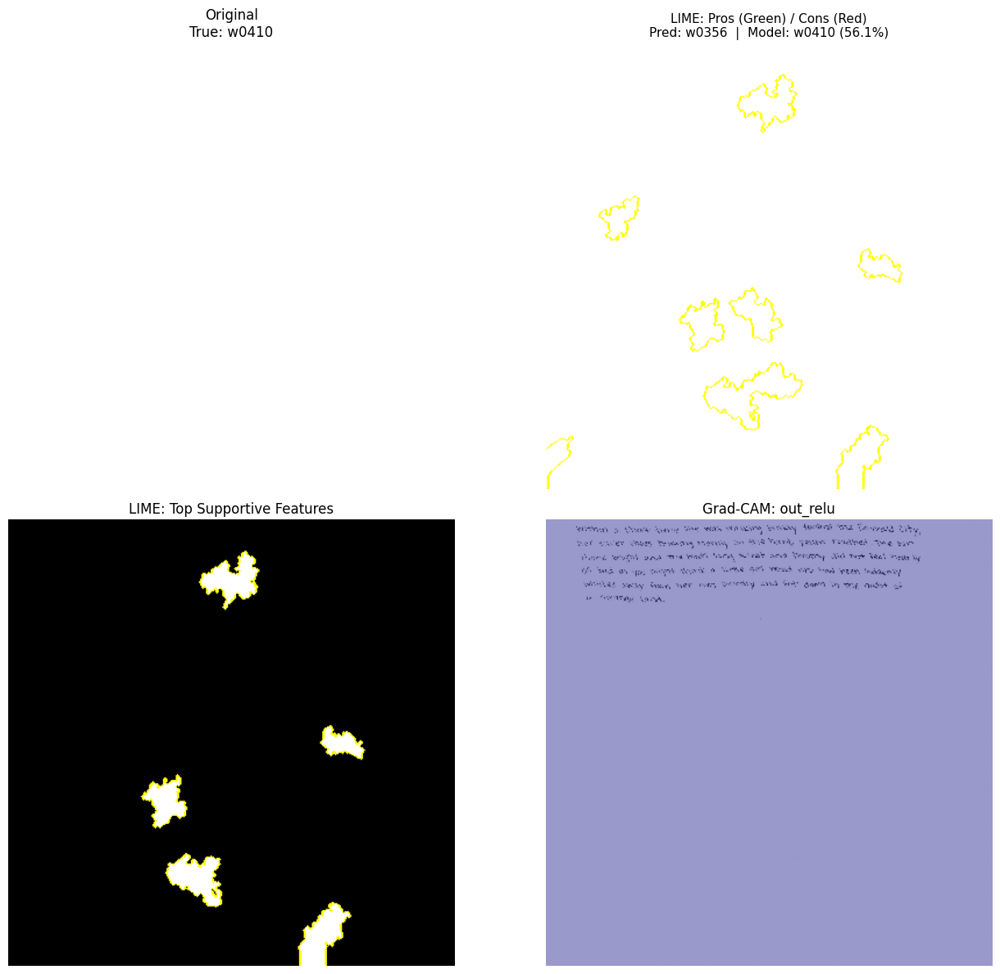

CPU times: user 20min 26s, sys: 14.2 s, total: 20min 41s
Wall time: 14min 39s


In [46]:
%%time
plot_ultimate_explanation(test_ds, model, last_conv_layer_name="out_relu")

raw image min: 61.754288
raw image max: 255.0
raw image mean: 252.85754
raw image dtype: float32
raw image shape: (384, 384, 3)


  0%|          | 0/500 [00:00<?, ?it/s]

grads min/max: -0.020369338 0.0056890883
pooled_grads min/max: -0.020369345 0.005689086
heatmap before relu min/max: -0.8212615 0.023799438
heatmap after relu/norm min/max: 0.0 1.0
temp_pn shape: (384, 384, 3)
temp_pn min: 0.3371594250202179 max: 1.0
lime_img min: 0.33715943 max: 1.0
mask_pn unique values: [0 1]


/tmp/ipykernel_379/2204473996.py:184: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet_rgb = cm.get_cmap("jet")(heatmap_resized)[..., :3]


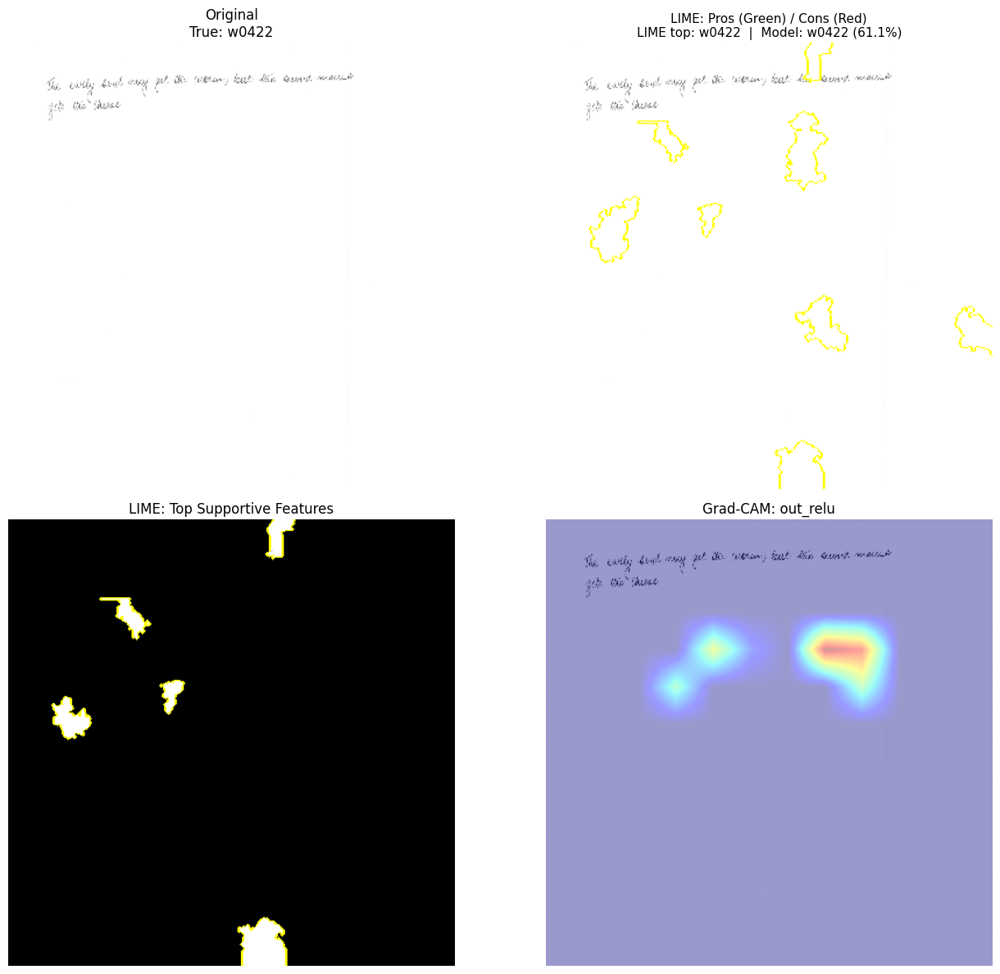

CPU times: user 20min 25s, sys: 14.3 s, total: 20min 39s
Wall time: 15min 19s


In [61]:
#new vers.
%%time
plot_ultimate_explanation(test_ds, model, last_conv_layer_name="out_relu")

  0%|          | 0/500 [00:00<?, ?it/s]

grads min/max: -0.018304886 0.005160764
pooled_grads min/max: -0.0054971226 0.0036508304
heatmap before relu min/max: -0.022061119 0.5581144
heatmap after relu/norm min/max: 0.0 1.0
temp_pn shape: (384, 384, 3)
temp_pn min: 0.34049496054649353 max: 1.0
lime_img min: 0.34049496 max: 1.0
mask_pn unique values: [0 1]


/tmp/ipykernel_379/4195751695.py:188: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet_rgb = cm.get_cmap("jet")(heatmap_resized)[..., :3]


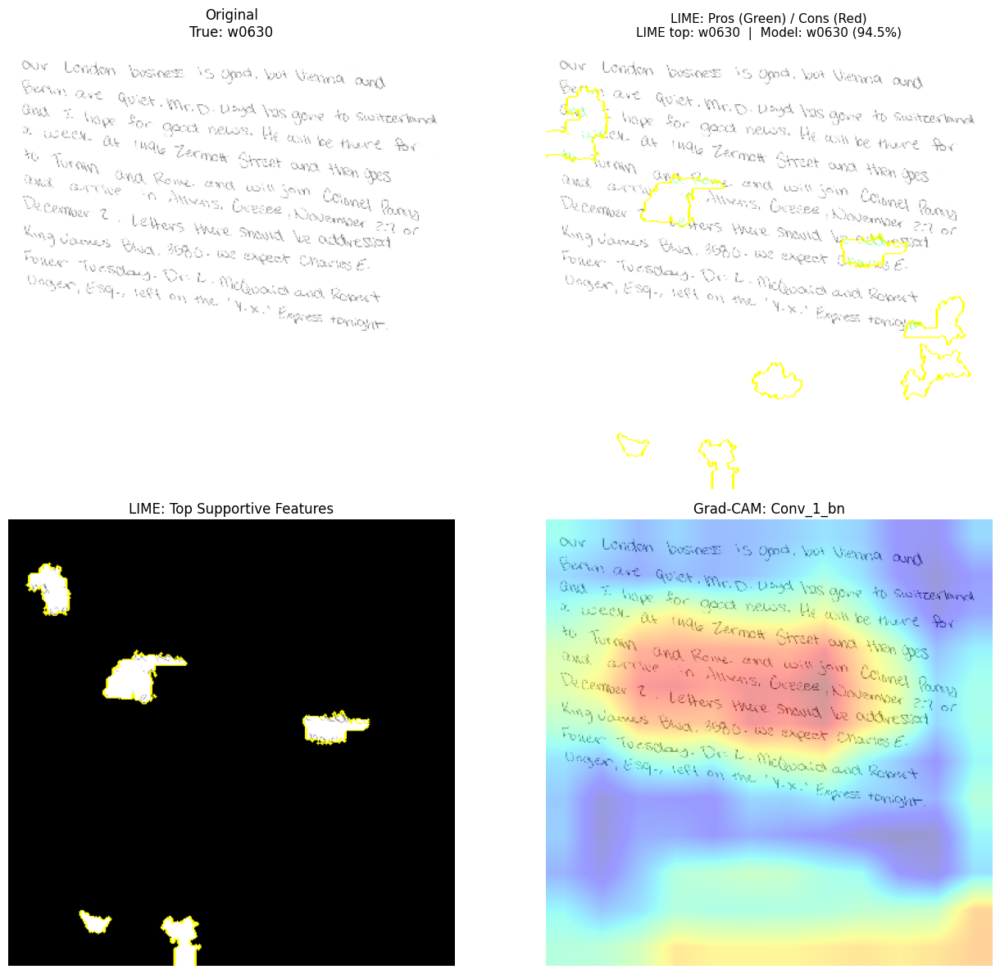

CPU times: user 20min 28s, sys: 13.7 s, total: 20min 42s
Wall time: 14min 28s


In [66]:
#new vers.
%%time
plot_ultimate_explanation(test_ds, model, last_conv_layer_name="Conv_1_bn")

grads min/max: -0.024610898 0.007523792
pooled_grads min/max: -0.02461089 0.007523792
heatmap before relu min/max: -0.36982256 0.11775096
heatmap after relu/norm min/max: 0.0 1.0


/tmp/ipykernel_379/2204473996.py:184: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet_rgb = cm.get_cmap("jet")(heatmap_resized)[..., :3]


grads min/max: -0.019484667 0.00835125
pooled_grads min/max: -0.01948466 0.008351248
heatmap before relu min/max: -0.28264305 0.15121627
heatmap after relu/norm min/max: 0.0 1.0
grads min/max: -0.028023673 0.0066392077
pooled_grads min/max: -0.028023664 0.0066392096
heatmap before relu min/max: -0.49556446 0.08209169
heatmap after relu/norm min/max: 0.0 1.0
grads min/max: -0.019484667 0.00835125
pooled_grads min/max: -0.01948466 0.008351248
heatmap before relu min/max: -0.32001936 0.18854356
heatmap after relu/norm min/max: 0.0 1.0


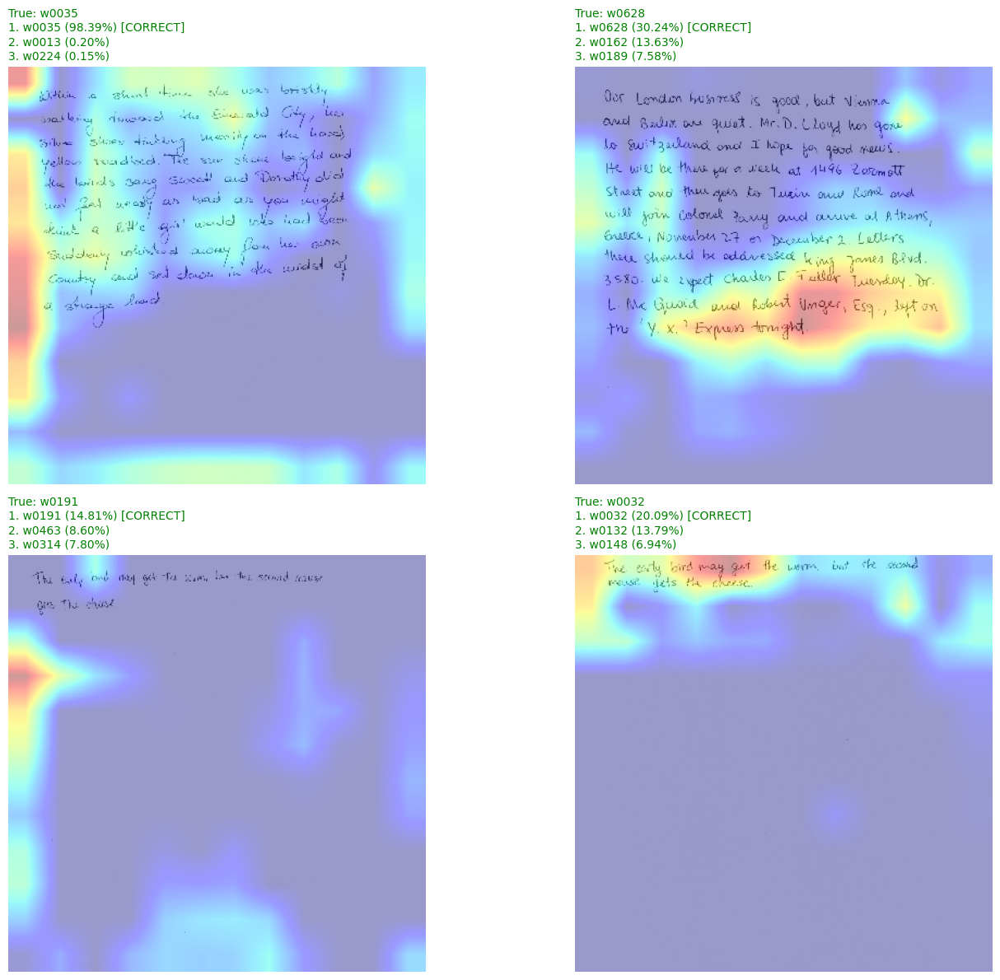

In [63]:
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)

block_15_depthwise


/tmp/ipykernel_379/4141797284.py:177: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet_rgb = cm.get_cmap("jet")(heatmap_resized)[..., :3]


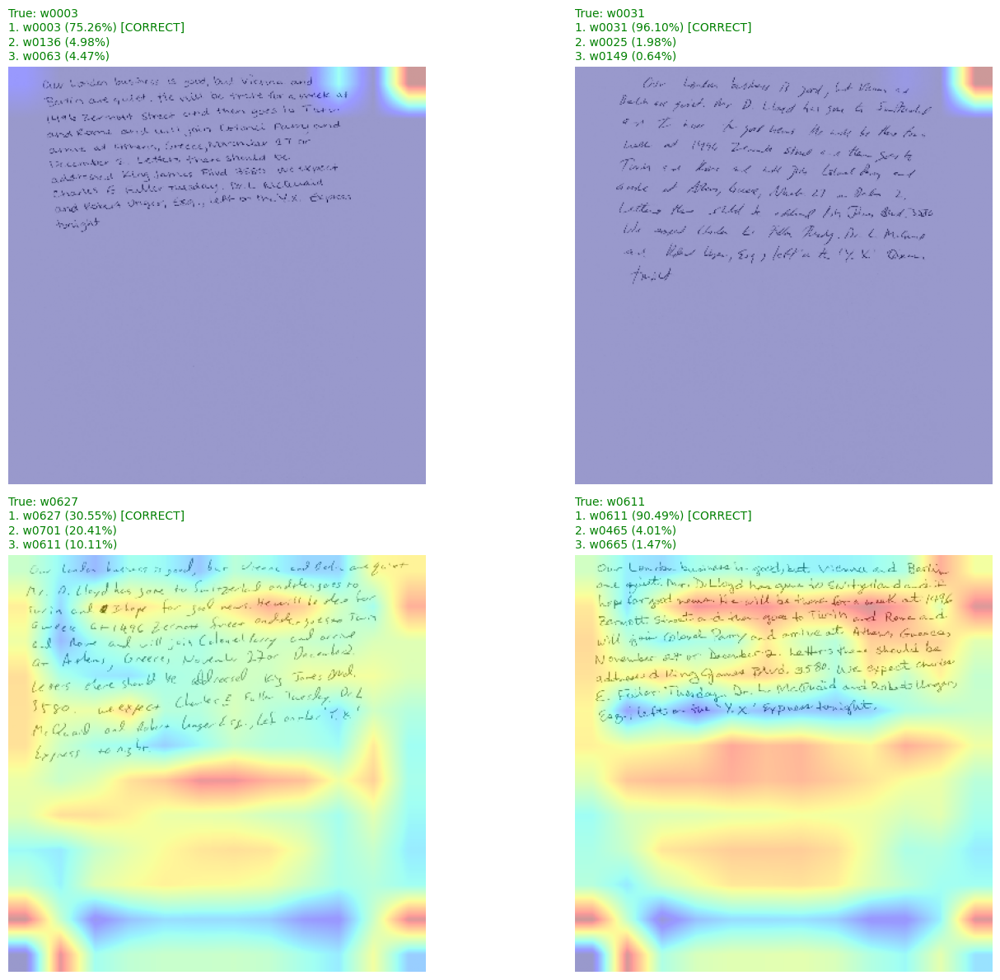



block_13_expand_relu


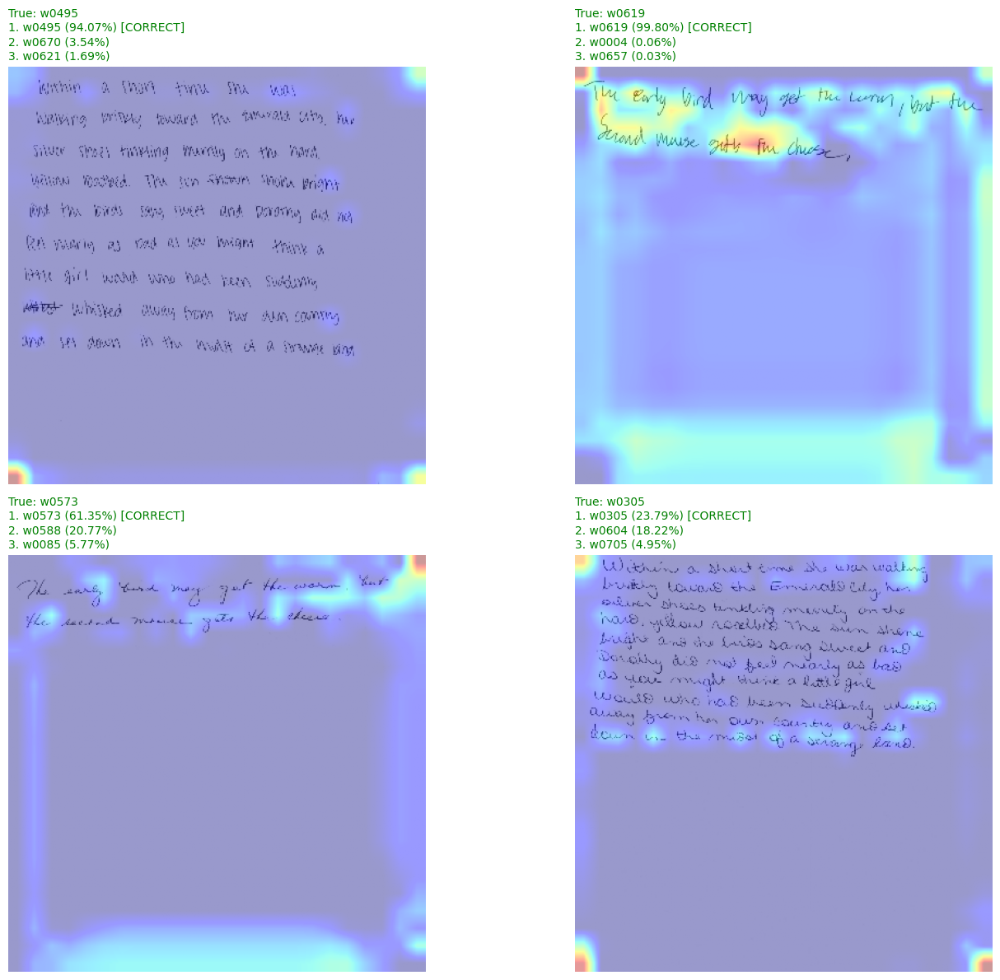



out_relu


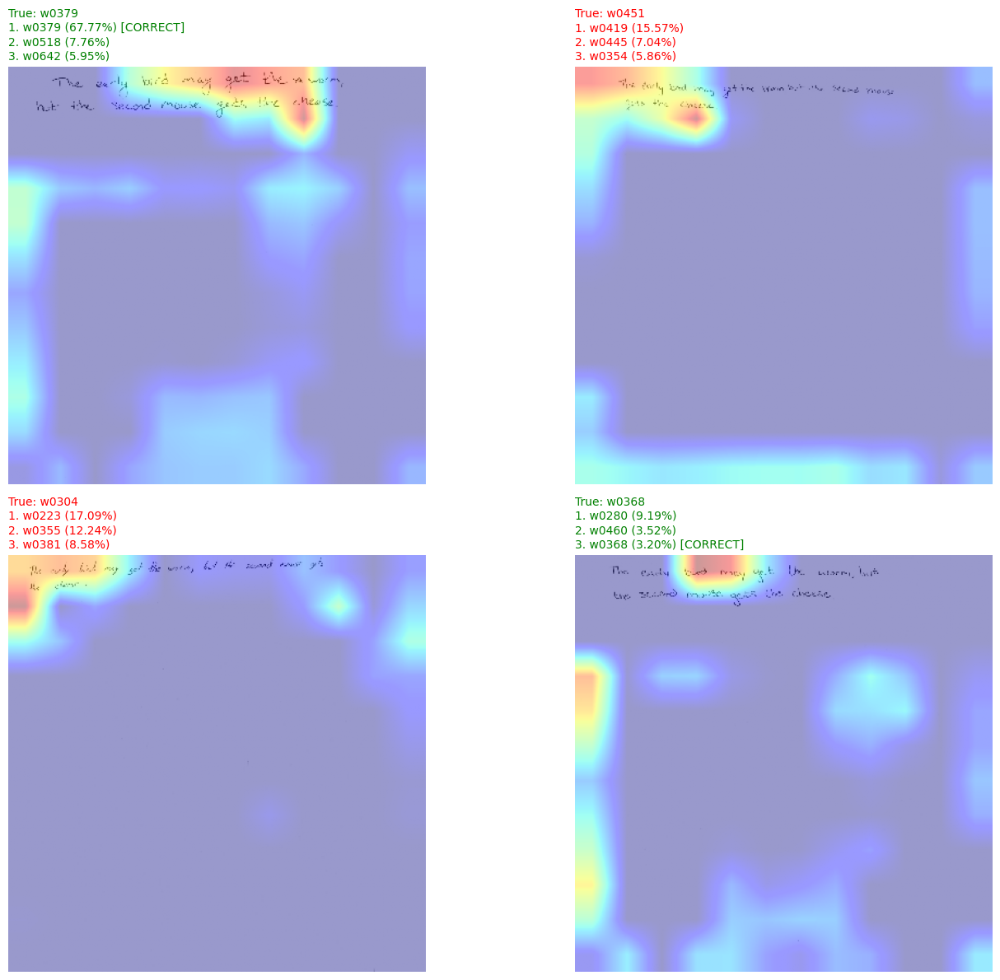

In [79]:
print("block_15_depthwise")
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="block_15_depthwise",n=4)
print("\n\nblock_13_expand_relu")
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="block_13_expand_relu",n=4)
print("\n\nout_relu")
plot_gradcam_from_dataset(dataset=test_ds,model=model,last_conv_layer_name="out_relu",n=4)

In [90]:
layerlist=list()
for layer in model.get_layer("mobilenetv2_1.00_224").layers:
    layerlist.append(layer)

len(layerlist)

154

In [91]:
model.get_layer("mobilenetv2_1.00_224").summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 192, 192,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 192, 192,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 192, 192,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 192, 192,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 192, 192,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 192, 192,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 193, 193,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 96, 96,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 96, 96,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [92]:
model2 = load_model("/content/MobileNetV2_allclass4.keras")
model2.summary()

Model: "mobilenet_allclass4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)